In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import numba
from numba import jit, prange
from mpl_toolkits.mplot3d import Axes3D
import scipy.stats as stats
import pickle
import matplotlib.gridspec as gridspec
# @jit(nopython=True, parallel=True)

In [2]:
# Set default parameters
plt.rcParams.update({
    'figure.dpi': 150,  # Set the default DPI to 150
    'axes.grid': False,       # Display grid on axes
    'xtick.top': True,       # Display ticks on the top of the x-axis
    'xtick.bottom': True,    # Display ticks on the bottom of the x-axis
    'ytick.left': True,      # Display ticks on the left of the y-axis
    'ytick.right': True,     # Display ticks on the right of the y-axis
    'xtick.direction': 'in',  # Set the direction of x-axis ticks to 'in'
    'ytick.direction': 'in',  # Set the direction of y-axis ticks to 'in'
    'font.size': 8           # Set the font size
})

In [3]:
# # List of some commonly used rcParams settings
# rc_params = [
#     'lines.linewidth',        # Line width
#     'lines.markersize',       # Marker size
#     'axes.grid',              # Display grid on axes
#     'axes.titlesize',         # Title font size
#     'axes.labelsize',         # Axis label font size
#     'xtick.labelsize',        # X-axis tick label font size
#     'ytick.labelsize',        # Y-axis tick label font size
#     'xtick.direction',        # X-axis tick direction ('in', 'out', or 'inout')
#     'ytick.direction',        # Y-axis tick direction ('in', 'out', or 'inout')
#     'xtick.top',              # Display ticks on the top of the x-axis
#     'xtick.bottom',           # Display ticks on the bottom of the x-axis
#     'ytick.left',             # Display ticks on the left of the y-axis
#     'ytick.right',            # Display ticks on the right of the y-axis
#     'figure.figsize',         # Figure size (width, height) in inches
#     'figure.dpi',             # Dots per inch (resolution)
#     'font.size',              # Font size for text
#     'font.family',            # Font family for text
#     'legend.fontsize',        # Legend font size
#     'legend.loc',             # Legend location ('upper right', 'lower left', etc.)
# ]

In [4]:
rho054 = np.load("/vol/calvin/data/adave/Internship/SmoothDensityField054.npy")

In [5]:
rho054.shape

(512, 512, 512)

In [6]:
class_054 = np.load("/vol/calvin/data/adave/Internship/Classification_matrix054.npy")

In [7]:
class_054.shape

(512, 512, 512)

In [8]:
v_field = np.load("/vol/calvin/data/adave/Internship/Velocity_field.npy")

In [9]:
v_field.shape

(134217728, 3)

In [10]:
pos = np.load("/vol/calvin/data/adave/Internship/Particle_position.npy")

In [11]:
pos.shape

(134217728, 3)

In [12]:
eign_054 = np.load("/vol/calvin/data/adave/Internship/eignvals_tidalshear054.npy")

In [13]:
eign_054.shape

(512, 512, 512, 3)

In [14]:
eignvec_054 = np.load("/vol/calvin/data/adave/Internship/eignvects_tidalshear054.npy")

In [15]:
eignvec_054.shape

(512, 512, 512, 3, 3)

In [16]:
eign_054 = eign_054.reshape((512*512*512, 3))

In [17]:
eign_054.shape

(134217728, 3)

In [18]:
box_size = 100 # h^-1 Mpc
grid_size = 512

voxel_size = box_size / grid_size

In [19]:
v_disp = np.load("/vol/calvin/data/adave/Internship/Velocity_dispersion_tensor_054.npy")

In [20]:
voxel_keys = np.load("/vol/calvin/data/adave/Internship/Voxel_keys.npy")

In [21]:
voxel_vel = np.load("/vol/calvin/data/adave/Internship/voxel_mean_vel.npy")

In [22]:
voxel_vel.shape

(512, 512, 512, 3)

In [23]:
voxel_pos = np.load("/vol/calvin/data/adave/Internship/voxel_mean_pos.npy")

In [24]:
voxel_pos.shape

(512, 512, 512, 3)

In [25]:
voxel_pos[voxel_pos == 0] = np.nan

In [26]:
# Load the dictionary from the pickle file
with open('voxel_info_054.pkl', 'rb') as pickle_file:
    voxel_info = pickle.load(pickle_file)

In [27]:
def create_vel_class(classification, velocity_field, voxel_info):
    velocity_field_class = {
            'void': [],
            'sheet': [],
            'filament': [],
            'node': []
            }
    
    if velocity_field.shape == (512**3, 3):
        velocity_field = velocity_field.reshape(512, 512, 512, 3)
    
    for voxel_indice in tqdm(voxel_keys):
        i, j, k = voxel_indice

        if classification[i, j, k] == 0 and len(voxel_info[i, j, k]) > 1:
            velocity_field_class['void'].append(velocity_field[i, j, k])

        elif classification[i, j, k] == 1 and len(voxel_info[i, j, k]) > 1:
            velocity_field_class['sheet'].append(velocity_field[i, j, k])

        elif classification[i, j, k] == 2 and len(voxel_info[i, j, k]) > 1:
            velocity_field_class['filament'].append(velocity_field[i, j, k])

        elif classification[i, j, k] == 3 and len(voxel_info[i, j, k]) > 1:
            velocity_field_class['node'].append(velocity_field[i, j, k])
    
    return velocity_field_class

In [28]:
velocity_dispersion_class =  create_vel_class(class_054, v_disp, voxel_info)

100%|██████████| 26564815/26564815 [02:08<00:00, 206247.58it/s]


In [27]:
velocity_class =  create_vel_class(class_054, v_field, voxel_info)

100%|██████████| 26564815/26564815 [01:54<00:00, 232316.95it/s]


In [29]:
eign_class = create_vel_class(class_054, eign_054, voxel_info)

100%|██████████| 26564815/26564815 [02:05<00:00, 212485.31it/s]


In [30]:
def extract_perp_comps(velocity_field_class, structure):
    
    if str(structure)[0] == 'v':
        diagonal_elements = np.array(velocity_field_class['void'])[:, np.arange(3), np.arange(3)]
        
        return diagonal_elements
    
    elif str(structure)[0] == 's':
        diagonal_elements = np.array(velocity_field_class['sheet'])[:, np.arange(3), np.arange(3)]
        
        return diagonal_elements
    
    elif str(structure)[0] == 'f':
        diagonal_elements = np.array(velocity_field_class['filament'])[:, np.arange(3), np.arange(3)]
        
        return diagonal_elements
    
    elif str(structure)[0] == 'n':
        diagonal_elements = np.array(velocity_field_class['node'])[:, np.arange(3), np.arange(3)]
        
        return diagonal_elements

In [31]:
def extract_diag_comps(velocity_field_class, structure):
    
    if str(structure)[0] == 'v':
        off_diagonal_elements = np.array(velocity_field_class['void'])[:, [0, 0, 1], [1, 2, 2]]
        
        return off_diagonal_elements
    
    elif str(structure)[0] == 's':
        off_diagonal_elements = np.array(velocity_field_class['sheet'])[:, [0, 0, 1], [1, 2, 2]]
        
        return off_diagonal_elements
    
    elif str(structure)[0] == 'f':
        off_diagonal_elements = np.array(velocity_field_class['filament'])[:, [0, 0, 1], [1, 2, 2]]
        
        return off_diagonal_elements
    
    elif str(structure)[0] == 'n':
        off_diagonal_elements = np.array(velocity_field_class['node'])[:, [0, 0, 1], [1, 2, 2]]
        
        return off_diagonal_elements

In [32]:
v_disp.shape

(512, 512, 512, 3, 3)

In [318]:
eigenvalues = np.zeros((512, 512, 512, 3))
eigenvectors = np.zeros((512, 512, 512, 3, 3))

for i in tqdm(range(512)):
    for j in range(512):
        for k in range(512):
            eigenvalues[i, j, k], eigenvectors[i, j, k] = np.linalg.eig(v_disp[i, j, k])

            # Sort the eigenvalues and corresponding eigenvectors in descending order
            sorted_indices = np.argsort(eigenvalues[i, j, k])[::-1]
            eigenvalues[i, j, k] = eigenvalues[i, j, k][sorted_indices]
            eigenvectors[i, j, k] = eigenvectors[i, j, k][sorted_indices]

  0%|          | 0/512 [00:00<?, ?it/s]/tmp/ipykernel_3475133/749746672.py:7: ComplexWarning: Casting complex values to real discards the imaginary part
  eigenvalues[i, j, k], eigenvectors[i, j, k] = np.linalg.eig(v_disp[i, j, k])
100%|██████████| 512/512 [1:49:52<00:00, 12.88s/it]


In [159]:
# Initialize arrays to store eigenvalues and eigenvectors
e_val_vdisp = np.zeros((512, 512, 512, 3))
e_vec_vdisp = np.zeros((512, 512, 512, 3, 3))

# Create meshgrid for indices
i, j, k = np.meshgrid(np.arange(512), np.arange(512), np.arange(512), indexing='ij')

print('Meshgrid created')

# Compute eigenvalues and eigenvectors using vectorized operation
e_vals, e_vecs = np.linalg.eig(v_disp)


print('Egnvalues computed')

# Assign eigenvalues and eigenvectors to the corresponding arrays
e_val_vdisp[i, j, k] = e_vals
e_vec_vdisp[i, j, k] = e_vecs

print('Values assigned')

Meshgrid created
Egnvalues computed


/tmp/ipykernel_3475133/741425971.py:21: ComplexWarning: Casting complex values to real discards the imaginary part
  e_val_vdisp[i, j, k] = e_vals
/tmp/ipykernel_3475133/741425971.py:22: ComplexWarning: Casting complex values to real discards the imaginary part
  e_vec_vdisp[i, j, k] = e_vecs


Values assigned


In [319]:
np.save("/vol/calvin/data/adave/Internship/v_disp_evals.npy", eigenvalues)

In [320]:
np.save("/vol/calvin/data/adave/Internship/v_disp_evects.npy", eigenvectors)

In [33]:
evals_vdisp = np.load("/vol/calvin/data/adave/Internship/v_disp_evals.npy")

In [34]:
evecs_vdisp = np.load("/vol/calvin/data/adave/Internship/v_disp_evects.npy")

In [35]:
veval_re = evals_vdisp.reshape((512*512*512, 3))

In [364]:
veval_re.shape

(134217728, 3)

/tmp/ipykernel_3475133/3532664279.py:3: RuntimeWarning: invalid value encountered in divide
  plt.hist((veval_re[:, 0] - veval_re[:, 2]) / (veval_re[:, 0] + veval_re[:, 1] + veval_re[:, 2]), histtype = 'step', density = True, label = 'Velocity dispersion eigenvalues')


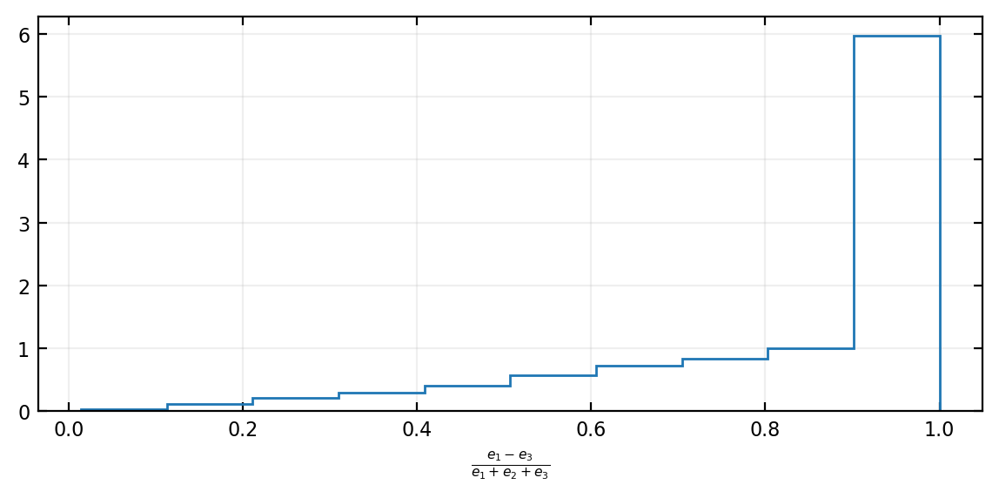

In [367]:
plt.figure(figsize = (7, 3), dpi = 200)

plt.hist((veval_re[:, 0] - veval_re[:, 2]) / (veval_re[:, 0] + veval_re[:, 1] + veval_re[:, 2]), histtype = 'step', density = True, label = 'Velocity dispersion eigenvalues')
# plt.hist((eign_054[:, 0] - eign_054[:, 2]) / (eign_054[:, 0] + eign_054[:, 1] + eign_054[:, 2]), histtype = 'step', density = True, label = 'Tidal eigenvalues')
plt.xlabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$')
plt.grid(True, alpha = 0.2)
plt.show()

In [365]:
expr_vd = (veval_re[:, 0] - veval_re[:, 2]) / (veval_re[:, 0] + veval_re[:, 1] + veval_re[:, 2])
expr_td = (eign_054[:, 0] - eign_054[:, 2]) / (eign_054[:, 0] + eign_054[:, 1] + eign_054[:, 2])

/tmp/ipykernel_3475133/2724180724.py:1: RuntimeWarning: invalid value encountered in divide
  expr_vd = (veval_re[:, 0] - veval_re[:, 2]) / (veval_re[:, 0] + veval_re[:, 1] + veval_re[:, 2])


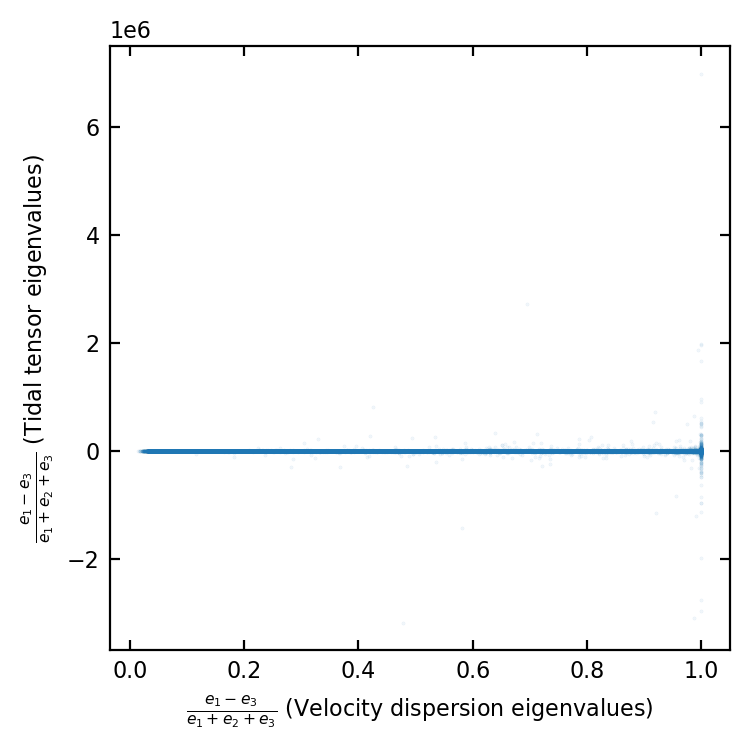

In [380]:
plt.figure(figsize = (4, 4), dpi = 200)
plt.scatter(expr_vd, expr_td, s = 0.1, alpha = 0.1)
plt.ylim(-1000, 1000)
plt.xlabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Velocity dispersion eigenvalues)')
plt.ylabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Tidal tensor eigenvalues)')
plt.show()

In [326]:
import numpy as np
from numba import jit
from tqdm import tqdm

@jit(nopython=True)
def calculate_cosines(eignvec_054, eigenvectors):
    
    all_cosines = np.zeros((512, 512, 512, 3, 3))
    
    for a in range(512):
        for b in range(512):
            for c in range(512):
                
                tidal_eigvecs = eignvec_054[a, b, c]
                disp_eigvecs = eigenvectors[a, b, c]
                
                cosines = np.zeros((3, 3))
    
                for i in range(3):
                    for j in range(3):
                        cosines[i, j] = np.dot(tidal_eigvecs[i], disp_eigvecs[j]) / (np.linalg.norm(tidal_eigvecs[i]) * np.linalg.norm(disp_eigvecs[j]))
                
                all_cosines[a, b, c] = cosines
    
    return all_cosines

all_cosines = calculate_cosines(eignvec_054, eigenvectors)

In [327]:
np.save("/vol/calvin/data/adave/Internship/all_cosines.npy", all_cosines)

In [36]:
all_cosines = np.load("/vol/calvin/data/adave/Internship/all_cosines.npy")

In [37]:
all_cosines.shape

(512, 512, 512, 3, 3)

In [38]:
cos_re = all_cosines.reshape((512*512*512, 3, 3))

In [39]:
vdisp_eval_class =  create_vel_class(class_054, evals_vdisp, voxel_info)

100%|██████████| 26564815/26564815 [01:54<00:00, 232551.52it/s]


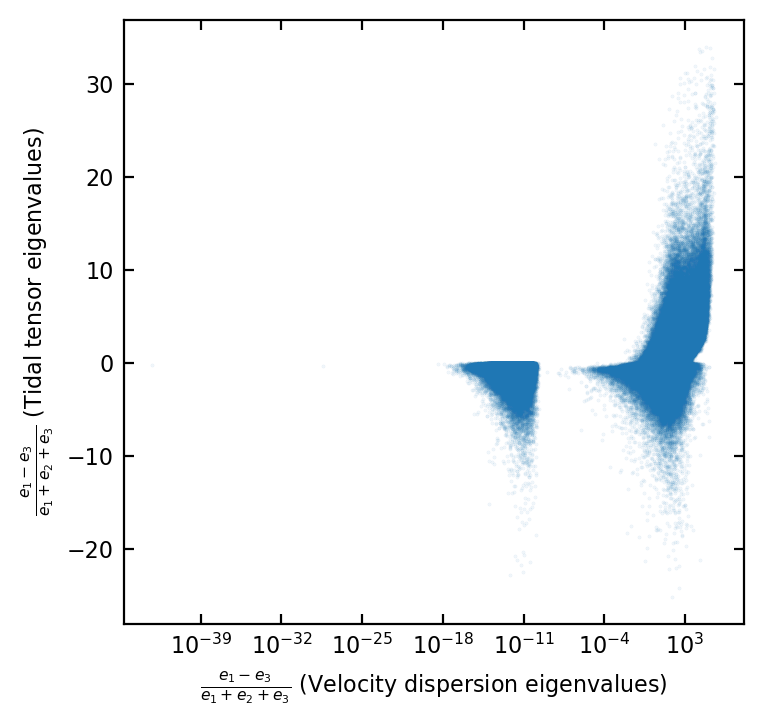

In [429]:
plt.figure(figsize = (4, 4), dpi = 200)
plt.scatter(vdisp_eval_class['sheet'][:1000000], eign_class['sheet'][:1000000], s = 0.1, alpha = 0.1)
# plt.ylim(-1000, 1000)
plt.xlabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Velocity dispersion eigenvalues)')
plt.ylabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Tidal tensor eigenvalues)')
# plt.xticks(fontsize = 8)
plt.xscale('log')
plt.show()

In [40]:
def calculate_sphericity(matrix1):
    
    matrix = np.array(matrix1)
    
    trace = matrix[:, 0] + matrix[:, 1] + matrix[:, 2]
    
    cal1 = (matrix[:, 0] - matrix[:, 2]) / trace
    
    return cal1

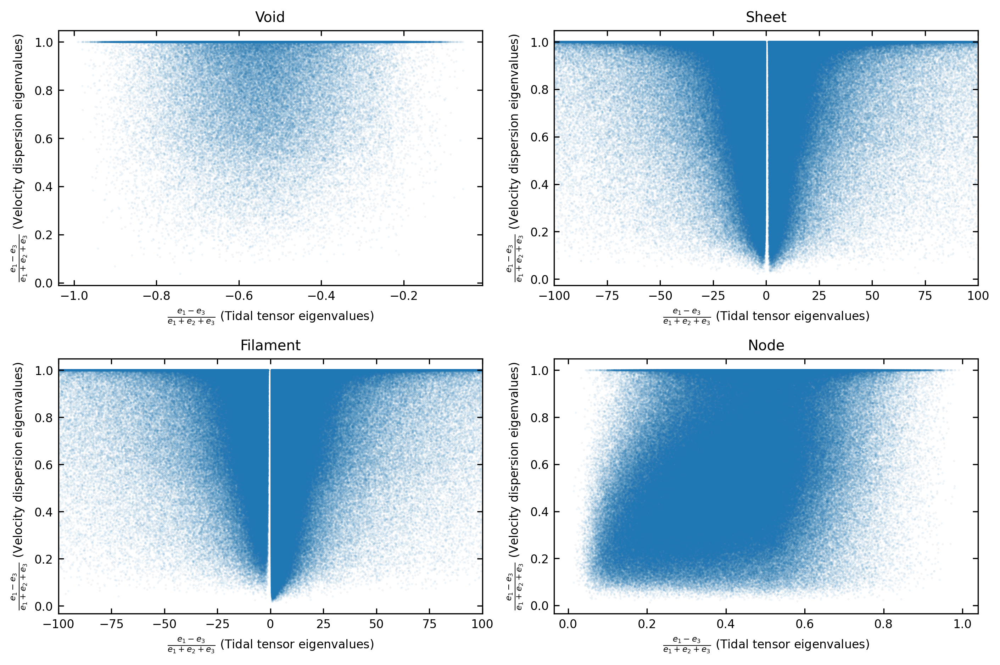

In [41]:
fig = plt.figure(figsize=(14, 9), dpi=300)

gs = gridspec.GridSpec(3, 3)


ax = plt.subplot(gs[0, 0])        
ax.scatter(calculate_sphericity(eign_class['void']), calculate_sphericity(vdisp_eval_class['void']), s = 0.1, alpha = 0.1)
ax.set_title('Void')
ax.set_xlabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Tidal tensor eigenvalues)')
ax.set_ylabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Velocity dispersion eigenvalues)')
# ax.set_ylim(-0.8, 0)
# ax.set_xlim(0, 1500)

ax = plt.subplot(gs[0, 1])        
ax.scatter(calculate_sphericity(eign_class['sheet']), calculate_sphericity(vdisp_eval_class['sheet']), s = 0.1, alpha = 0.1)
ax.set_title('Sheet')
ax.set_xlabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Tidal tensor eigenvalues)')
ax.set_ylabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Velocity dispersion eigenvalues)')
ax.set_xlim(-100, 100)
# ax.set_xlim(0, 5e5)
# ax.set_xticks(['0', '2000', '4000', '6000', '8000'], fontsize = 10)

ax = plt.subplot(gs[1, 0])        
ax.scatter(calculate_sphericity(eign_class['filament']), calculate_sphericity(vdisp_eval_class['filament']), s = 0.1, alpha = 0.1)
ax.set_title('Filament')
ax.set_xlabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Tidal tensor eigenvalues)')
ax.set_ylabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Velocity dispersion eigenvalues)')
ax.set_xlim(-100, 100)

ax = plt.subplot(gs[1, 1])        
ax.scatter(calculate_sphericity(eign_class['node']), calculate_sphericity(vdisp_eval_class['node']), s = 0.1, alpha = 0.1)
ax.set_title('Node')
ax.set_xlabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Tidal tensor eigenvalues)')
ax.set_ylabel(r'$\frac{e_1 - e_3}{e_1 + e_2 + e_3}$' + ' (Velocity dispersion eigenvalues)')
# ax.set_xlim(0, 1e6)

plt.tight_layout()
plt.show()

In [132]:
len(np.where(np.abs(calculate_sphericity(eign_class['sheet'])) <= 10)[0]) / len(np.array(eign_class['sheet'])[:, 0])

0.7937876684221774

In [134]:
len(np.where(np.abs(calculate_sphericity(eign_class['filament'])) <= 10)[0]) / len(np.array(eign_class['filament'])[:, 0])

0.8488639756667318

In [42]:
cosine_class =  create_vel_class(class_054, all_cosines, voxel_info)

100%|██████████| 26564815/26564815 [01:01<00:00, 432800.78it/s]


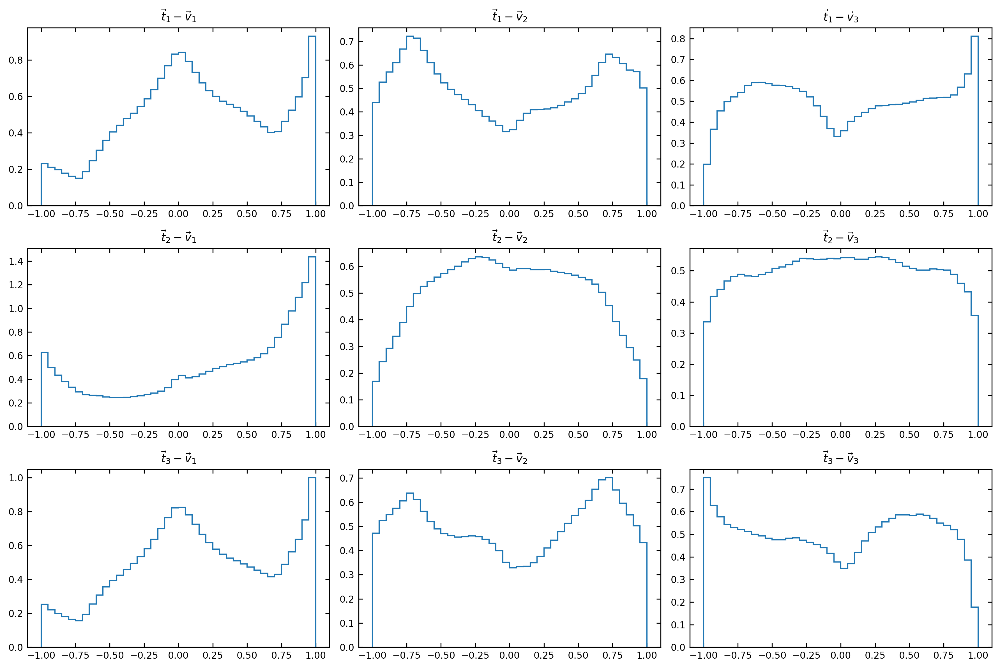

In [330]:
fig = plt.figure(figsize=(12, 8), dpi=300)

gs = gridspec.GridSpec(3, 3)

for i in range(3):
    for j in range(3):
        axes = plt.subplot(gs[i, j])

        axes.hist(cos_re[:, i, j], bins=40, histtype = 'step', density = True)
        axes.set_title(r"$\vec{t}_{x} - \vec{v}_{y}$".format(t = 't', v = 'v', x = i+1, y = j+1))
        
plt.tight_layout()
plt.show()

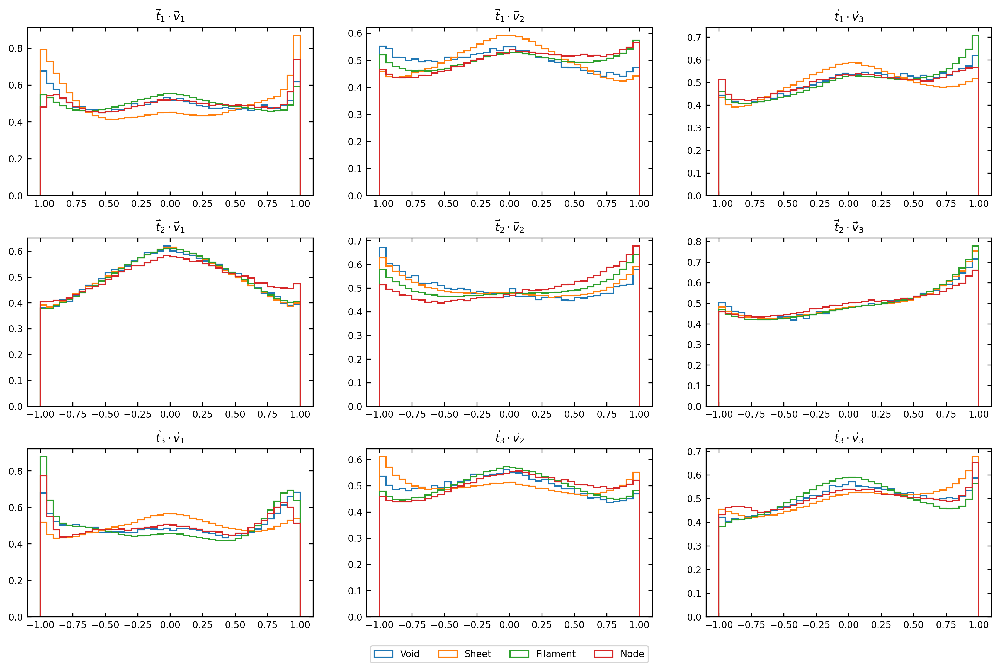

In [43]:
fig = plt.figure(figsize=(12, 8), dpi=300)

gs = gridspec.GridSpec(3, 3)

for i in range(3):
    for j in range(3):
        axes = plt.subplot(gs[i, j])

        axes.hist(np.array(cosine_class['void'])[:, i, j], bins=40, histtype = 'step', density = True, label = 'Void')
        axes.hist(np.array(cosine_class['sheet'])[:, i, j], bins=40, histtype = 'step', density = True, label = 'Sheet')
        axes.hist(np.array(cosine_class['filament'])[:, i, j], bins=40, histtype = 'step', density = True, label = 'Filament')
        axes.hist(np.array(cosine_class['node'])[:, i, j], bins=40, histtype = 'step', density = True, label = 'Node')
        axes.set_title(r"$\vec{t}_{x} \cdot \vec{v}_{y}$".format(t = 't', v = 'v', x = i+1, y = j+1))
        
        if i == 2 and j == 1:
            axes.legend(bbox_to_anchor = (0.5, -0.3), ncol = 4, loc = 'lower center')
            
plt.tight_layout()
plt.show()

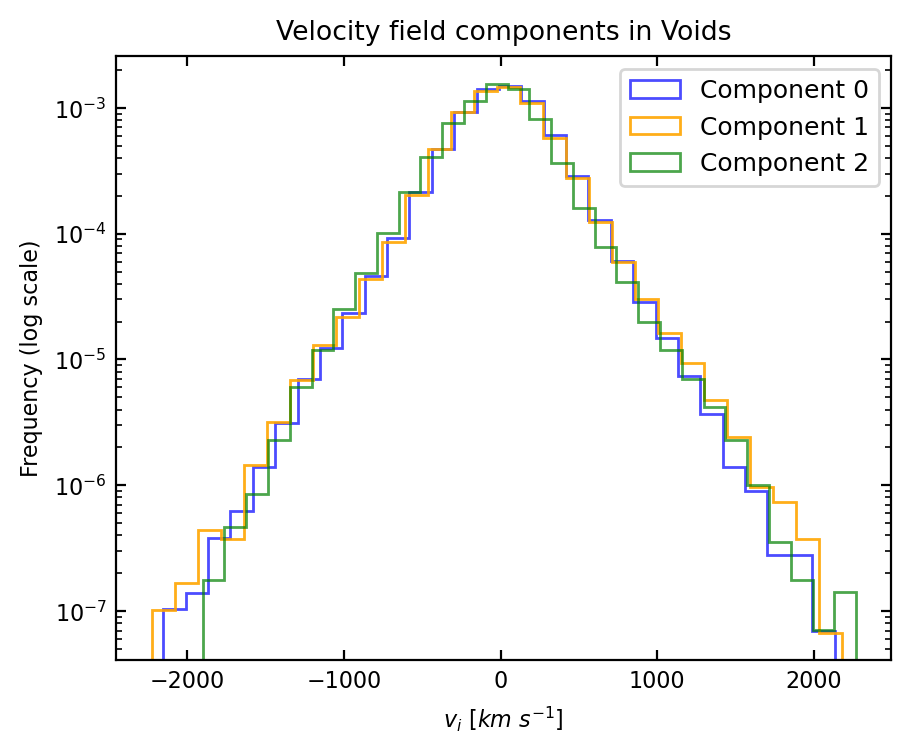

In [31]:
vel_data_v = np.array(velocity_class['void'])

plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(vel_data_v[:, 0], bins=30, log=True, density=True, alpha=0.7, label='Component 0', color='blue', histtype = 'step')
plt.hist(vel_data_v[:, 1], bins=30, log=True, density=True, alpha=0.9, label='Component 1', color='orange', histtype = 'step')
plt.hist(vel_data_v[:, 2], bins=30, log=True, density=True, alpha=0.7, label='Component 2', color='green', histtype = 'step')

# Add labels and legend
plt.title('Velocity field components in Voids')
plt.xlabel('$v_{i}~[km~s^{-1}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()


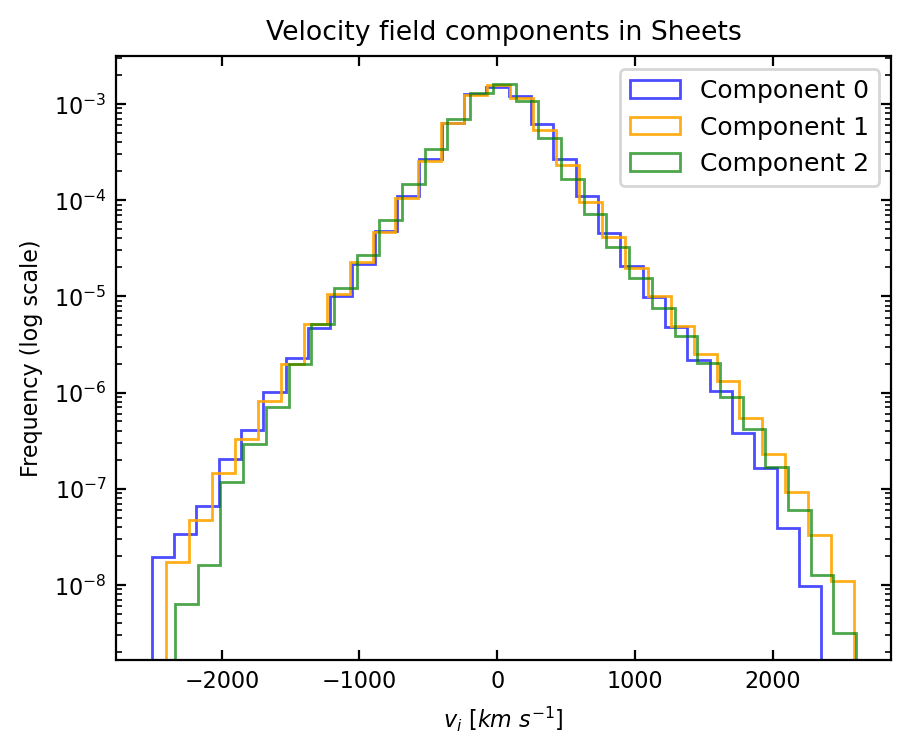

In [32]:
vel_data_s = np.array(velocity_class['sheet'])

plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(vel_data_s[:, 0], bins=30, log=True, density=True, alpha=0.7, label='Component 0', color='blue', histtype = 'step')
plt.hist(vel_data_s[:, 1], bins=30, log=True, density=True, alpha=0.9, label='Component 1', color='orange', histtype = 'step')
plt.hist(vel_data_s[:, 2], bins=30, log=True, density=True, alpha=0.7, label='Component 2', color='green', histtype = 'step')

# Add labels and legend
plt.title('Velocity field components in Sheets')
plt.xlabel('$v_{i}~[km~s^{-1}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()


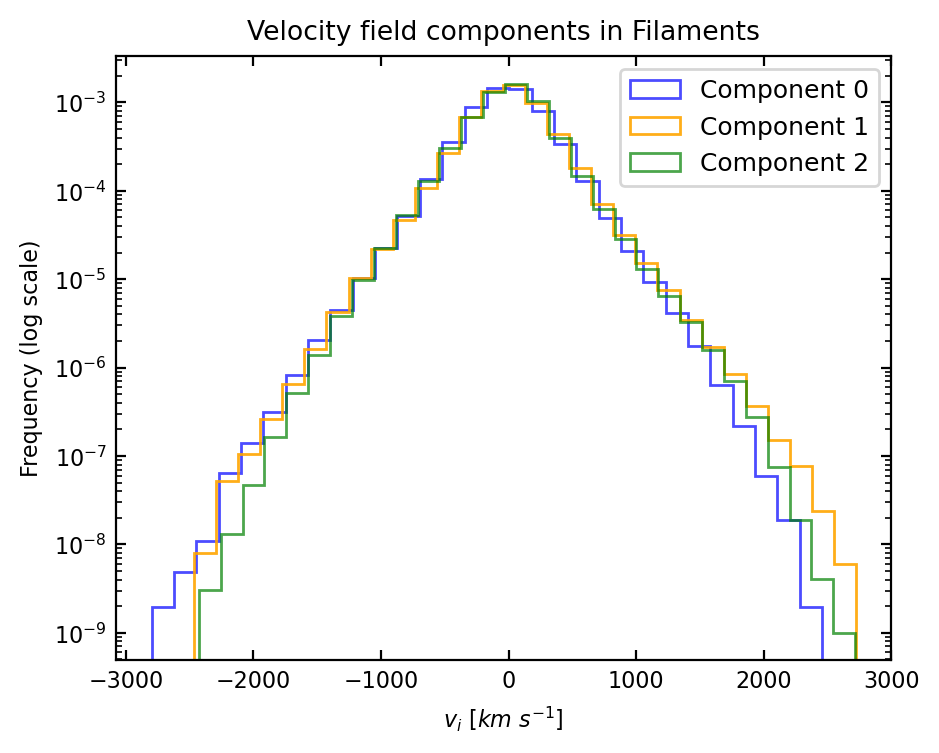

In [33]:
vel_data_f = np.array(velocity_class['filament'])

plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(vel_data_f[:, 0], bins=30, log=True, density=True, alpha=0.7, label='Component 0', color='blue', histtype = 'step')
plt.hist(vel_data_f[:, 1], bins=30, log=True, density=True, alpha=0.9, label='Component 1', color='orange', histtype = 'step')
plt.hist(vel_data_f[:, 2], bins=30, log=True, density=True, alpha=0.7, label='Component 2', color='green', histtype = 'step')

# Add labels and legend
plt.title('Velocity field components in Filaments')
plt.xlabel('$v_{i}~[km~s^{-1}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()


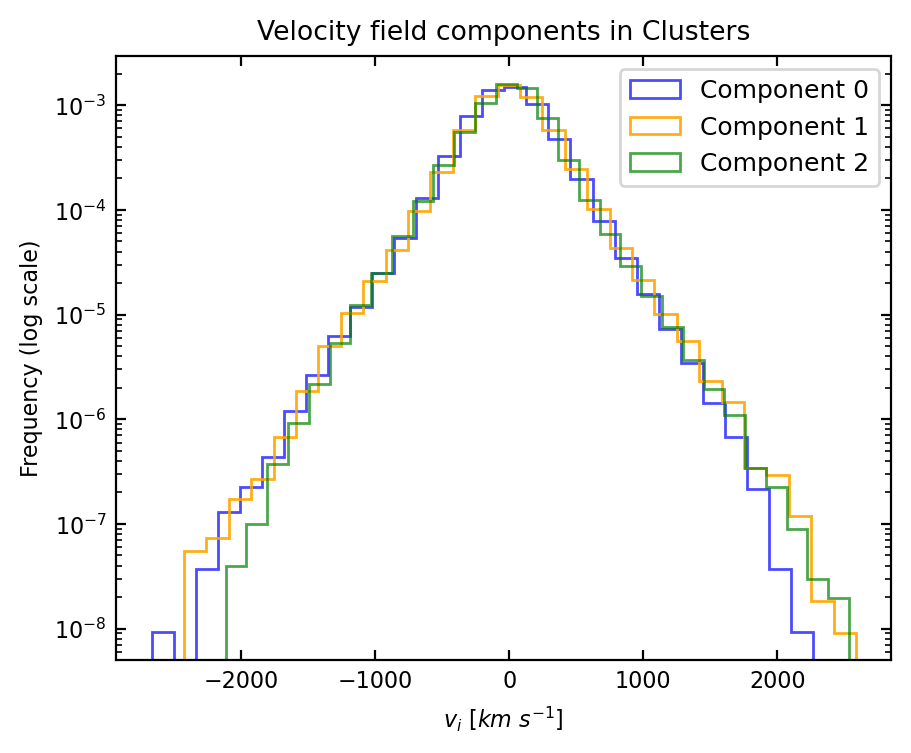

In [34]:
vel_data_n = np.array(velocity_class['node'])

plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(vel_data_n[:, 0], bins=30, log=True, density=True, alpha=0.7, label='Component 0', color='blue', histtype = 'step')
plt.hist(vel_data_n[:, 1], bins=30, log=True, density=True, alpha=0.9, label='Component 1', color='orange', histtype = 'step')
plt.hist(vel_data_n[:, 2], bins=30, log=True, density=True, alpha=0.7, label='Component 2', color='green', histtype = 'step')

# Add labels and legend
plt.title('Velocity field components in Clusters')
plt.xlabel('$v_{i}~[km~s^{-1}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()


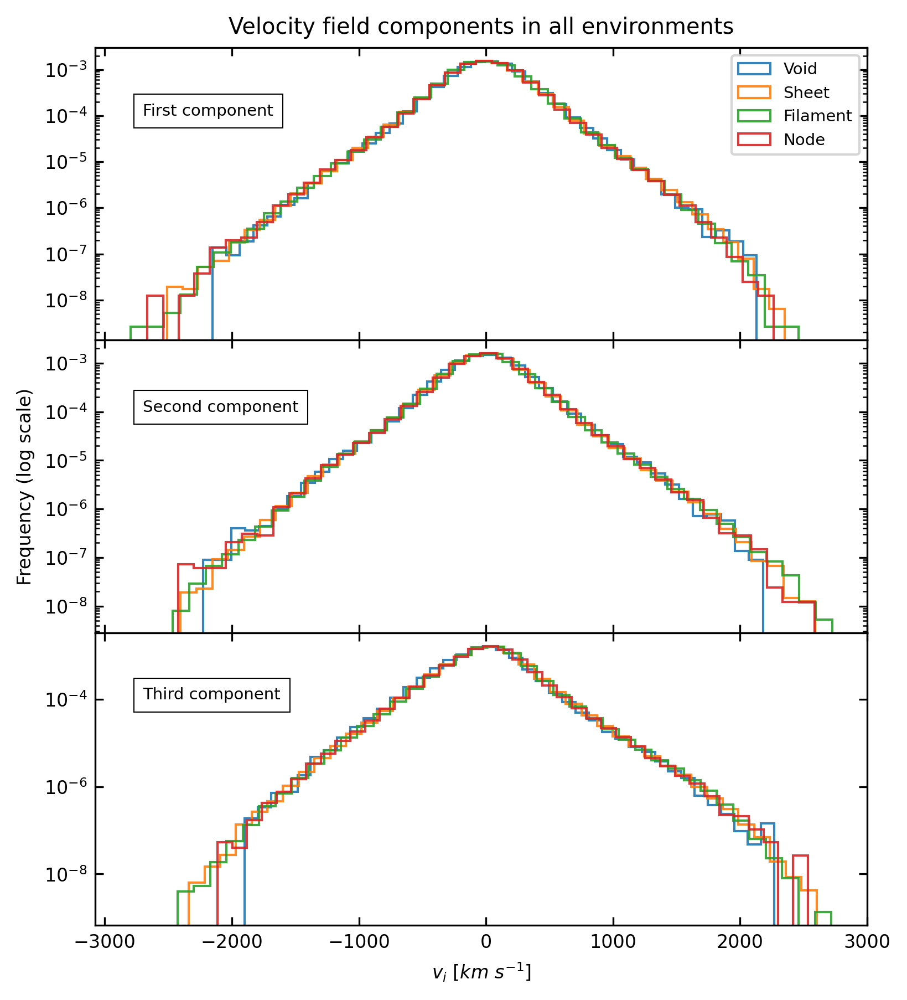

In [35]:
fig, axs = plt.subplots(3, 1, figsize=(6, 7), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

for i in range(3):
    axs[i].hist(vel_data_v[:, i], bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
    axs[i].hist(vel_data_s[:, i], bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
    axs[i].hist(vel_data_f[:, i], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
    axs[i].hist(vel_data_n[:, i], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')
    axs[i].text(-2700, 1e-4, f"{['First component', 'Second component', 'Third component'][i]}", fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

axs[0].set_title('Velocity field components in all environments')
axs[1].set_ylabel('Frequency (log scale)')
axs[0].legend(fontsize=7)

axs[-1].set_xlabel('$v_{i}~[km~s^{-1}]$')

plt.show()


In [36]:
vel_mag_v = np.linalg.norm(vel_data_v, axis = 1)
np.mean(vel_mag_v)

458.132

In [37]:
np.max(vel_mag_v) - np.min(vel_mag_v)

2639.517

In [38]:
vel_mag_s = np.linalg.norm(vel_data_s, axis = 1)
np.mean(vel_mag_s)

447.8151

In [39]:
np.max(vel_mag_s) - np.min(vel_mag_s)

2929.9795

In [40]:
vel_mag_f = np.linalg.norm(vel_data_f, axis = 1)
np.mean(vel_mag_f)

446.3194

In [41]:
np.max(vel_mag_f) - np.min(vel_mag_f)

3025.1404

In [42]:
vel_mag_n = np.linalg.norm(vel_data_n, axis = 1)
np.mean(vel_mag_n)

446.2301

In [43]:
np.max(vel_mag_n) - np.min(vel_mag_n)

2929.5498

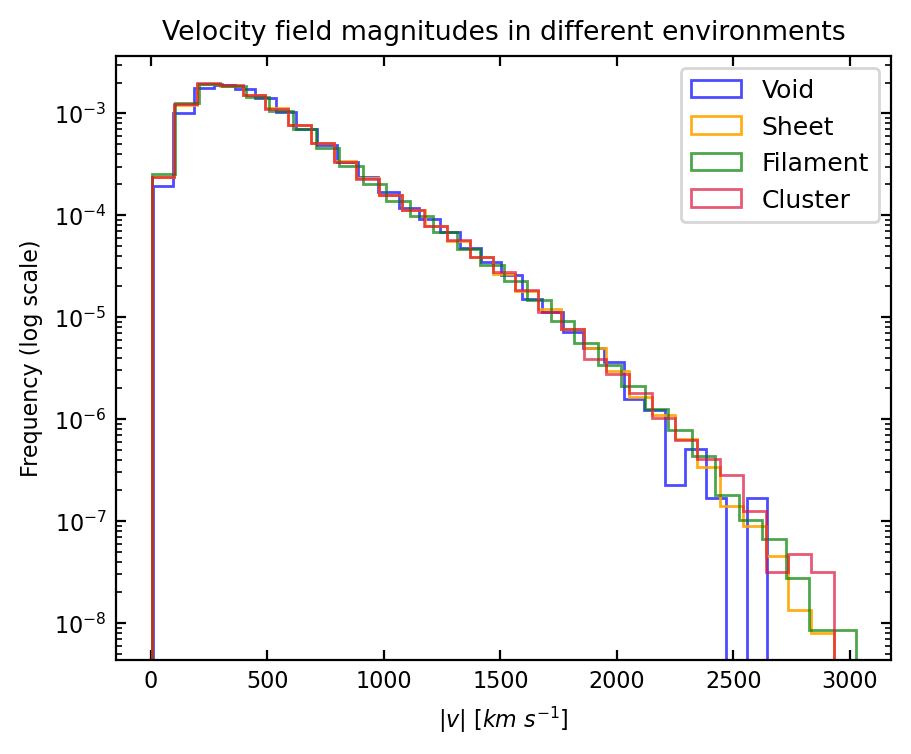

In [44]:
plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(vel_mag_v, bins=30, log=True, density=True, alpha=0.7, label='Void', color='blue', histtype = 'step')
plt.hist(vel_mag_s, bins=30, log=True, density=True, alpha=0.9, label='Sheet', color='orange', histtype = 'step')
plt.hist(vel_mag_f, bins=30, log=True, density=True, alpha=0.7, label='Filament', color='green', histtype = 'step')
plt.hist(vel_mag_n, bins=30, log=True, density=True, alpha=0.7, label='Cluster', color='crimson', histtype = 'step')

# Add labels and legend
plt.title('Velocity field magnitudes in different environments')
plt.xlabel('$|v|~[km~s^{-1}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()


In [45]:
v_disp[0, 0, 0]

array([[132.80827178,  99.34275255,  75.95334821],
       [ 99.34275255,  76.18896728,  58.04811419],
       [ 75.95334821,  58.04811419,  44.24801097]])

In [46]:
np.min(velocity_dispersion_class['sheet'])

-321084.70236498426

### Velocity dispersion

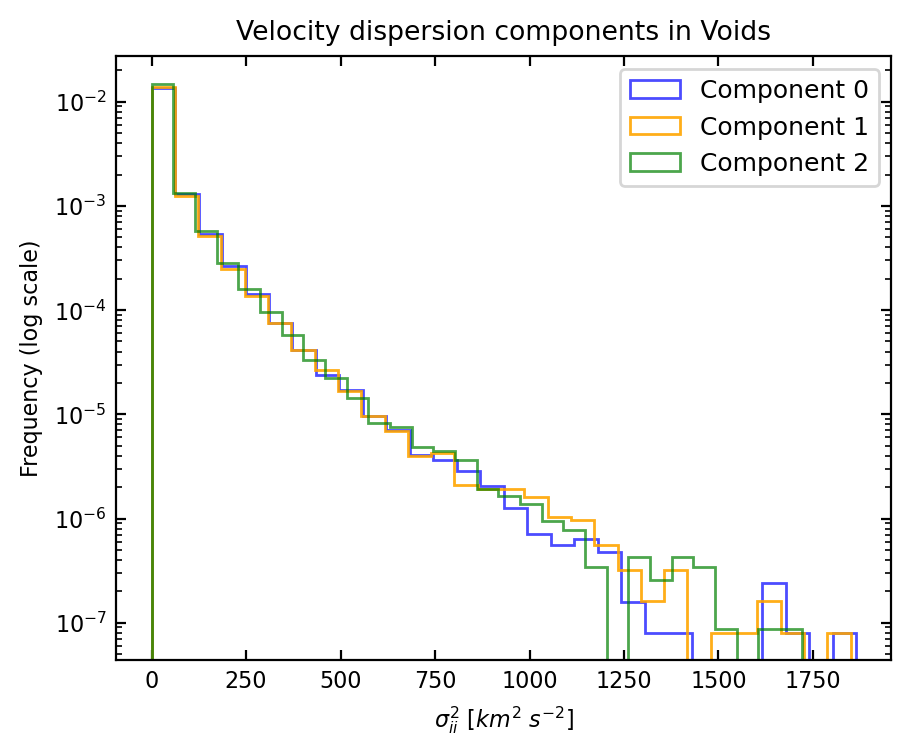

In [41]:
data_v = extract_perp_comps(velocity_dispersion_class, 'v')
data_v_diag = extract_diag_comps(velocity_dispersion_class, 'v')

plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(data_v[:, 0], bins=30, log=True, density=True, alpha=0.7, label='Component 0', color='blue', histtype = 'step')
plt.hist(data_v[:, 1], bins=30, log=True, density=True, alpha=0.9, label='Component 1', color='orange', histtype = 'step')
plt.hist(data_v[:, 2], bins=30, log=True, density=True, alpha=0.7, label='Component 2', color='green', histtype = 'step')

# Add labels and legend
plt.title('Velocity dispersion components in Voids')
plt.xlabel('$\sigma^2_{ii}~[km^2~s^{-2}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()

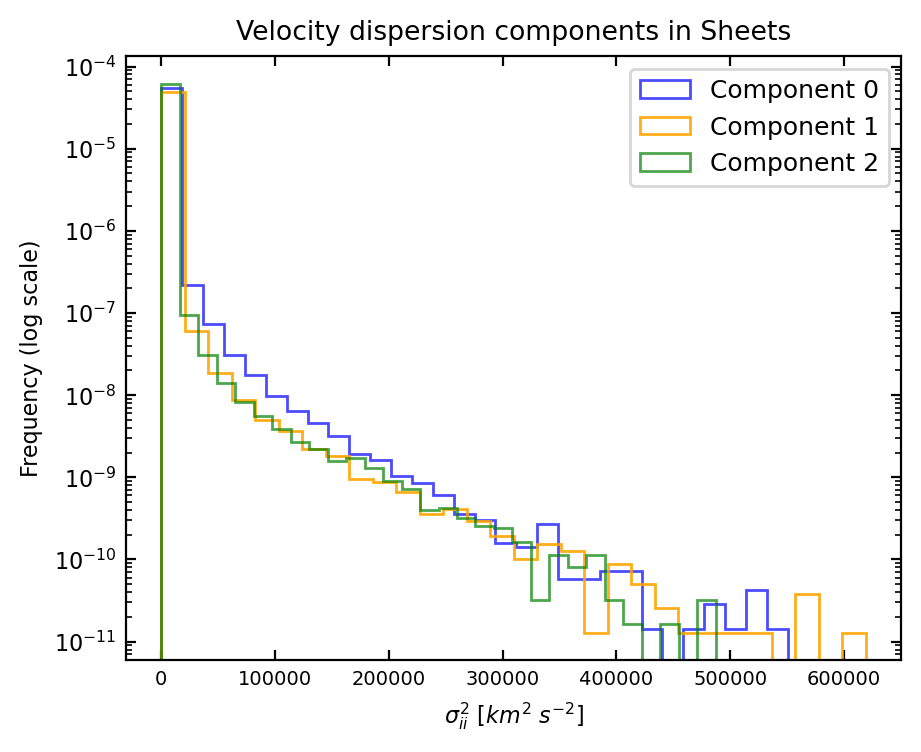

In [42]:
data_s = extract_perp_comps(velocity_dispersion_class, 's')
data_s_diag = extract_diag_comps(velocity_dispersion_class, 's')

plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(data_s[:, 0], bins=30, log=True, density=True, alpha=0.7, label='Component 0', color='blue', histtype = 'step')
plt.hist(data_s[:, 1], bins=30, log=True, density=True, alpha=0.9, label='Component 1', color='orange', histtype = 'step')
plt.hist(data_s[:, 2], bins=30, log=True, density=True, alpha=0.7, label='Component 2', color='green', histtype = 'step')

# Add labels and legend
plt.title('Velocity dispersion components in Sheets')
plt.xlabel('$\sigma^2_{ii}~[km^2~s^{-2}]$')
plt.ylabel('Frequency (log scale)')
plt.xticks(fontsize = 7)
plt.legend(fontsize = 9)

plt.show()


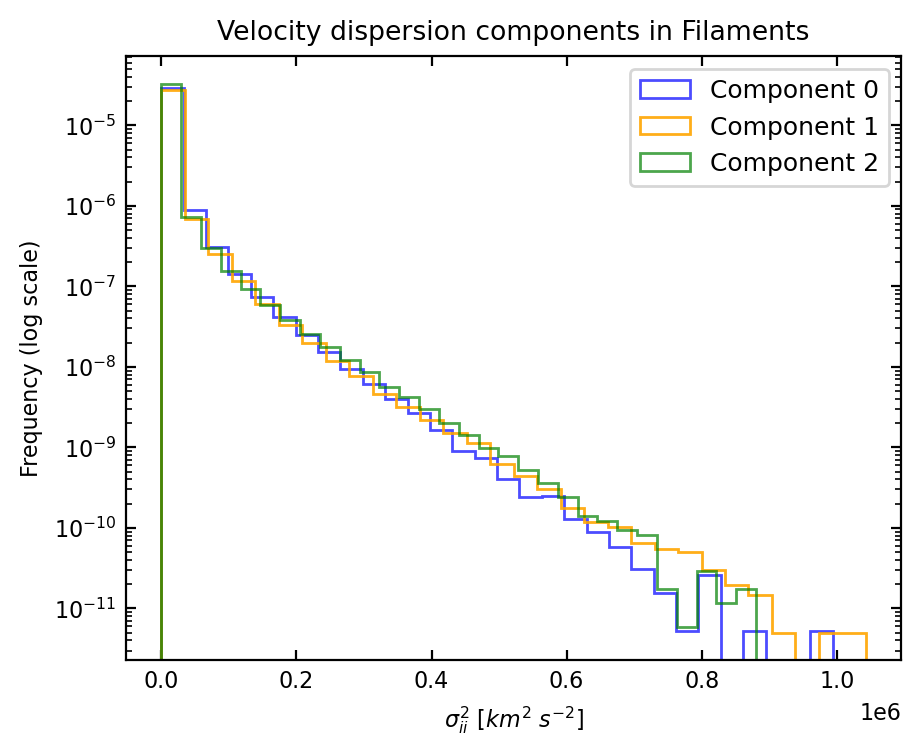

In [43]:
data_f = extract_perp_comps(velocity_dispersion_class, 'f')
data_f_diag = extract_diag_comps(velocity_dispersion_class, 'f')

plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(data_f[:, 0], bins=30, log=True, density=True, alpha=0.7, label='Component 0', color='blue', histtype = 'step')
plt.hist(data_f[:, 1], bins=30, log=True, density=True, alpha=0.9, label='Component 1', color='orange', histtype = 'step')
plt.hist(data_f[:, 2], bins=30, log=True, density=True, alpha=0.7, label='Component 2', color='green', histtype = 'step')

# Add labels and legend
plt.title('Velocity dispersion components in Filaments')
plt.xlabel('$\sigma^2_{ii}~[km^2~s^{-2}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()


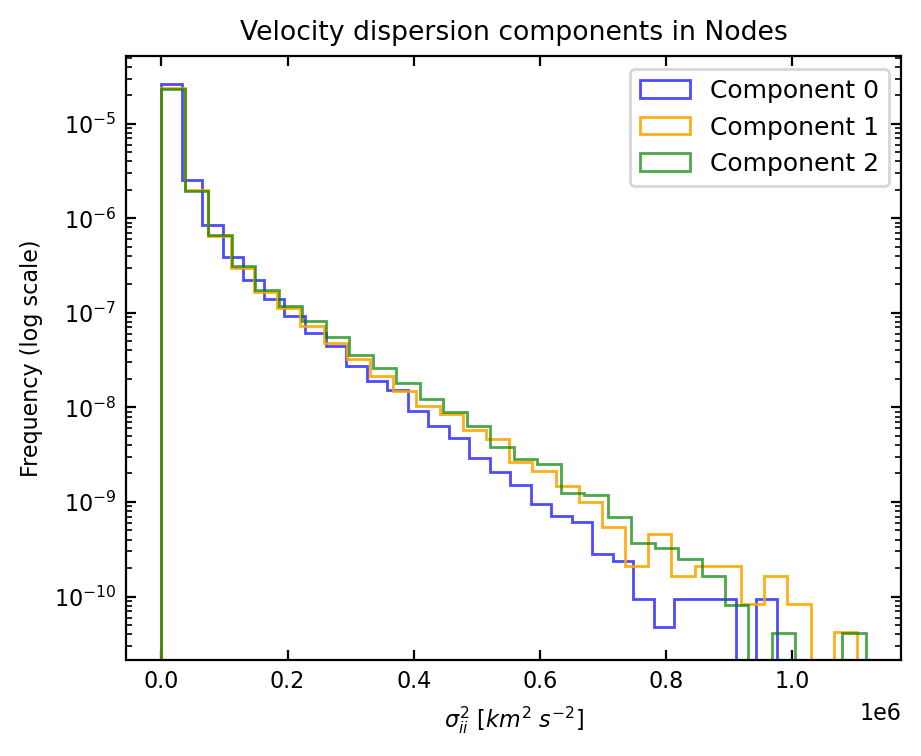

In [44]:
data_n = extract_perp_comps(velocity_dispersion_class, 'n')
data_n_diag = extract_diag_comps(velocity_dispersion_class, 'n')
plt.figure(figsize = (5, 4), dpi = 200)
# Plot histograms with transparency and different colors
plt.hist(data_n[:, 0], bins=30, log=True, density=True, alpha=0.7, label='Component 0', color='blue', histtype = 'step')
plt.hist(data_n[:, 1], bins=30, log=True, density=True, alpha=0.9, label='Component 1', color='orange', histtype = 'step')
plt.hist(data_n[:, 2], bins=30, log=True, density=True, alpha=0.7, label='Component 2', color='green', histtype = 'step')

# Add labels and legend
plt.title('Velocity dispersion components in Nodes')
plt.xlabel('$\sigma^2_{ii}~[km^2~s^{-2}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()


In [45]:
data_v.shape

(202004, 3)

In [46]:
data_s.shape

(3813705, 3)

In [47]:
data_f.shape

(5807358, 3)

In [48]:
data_n.shape

(652853, 3)

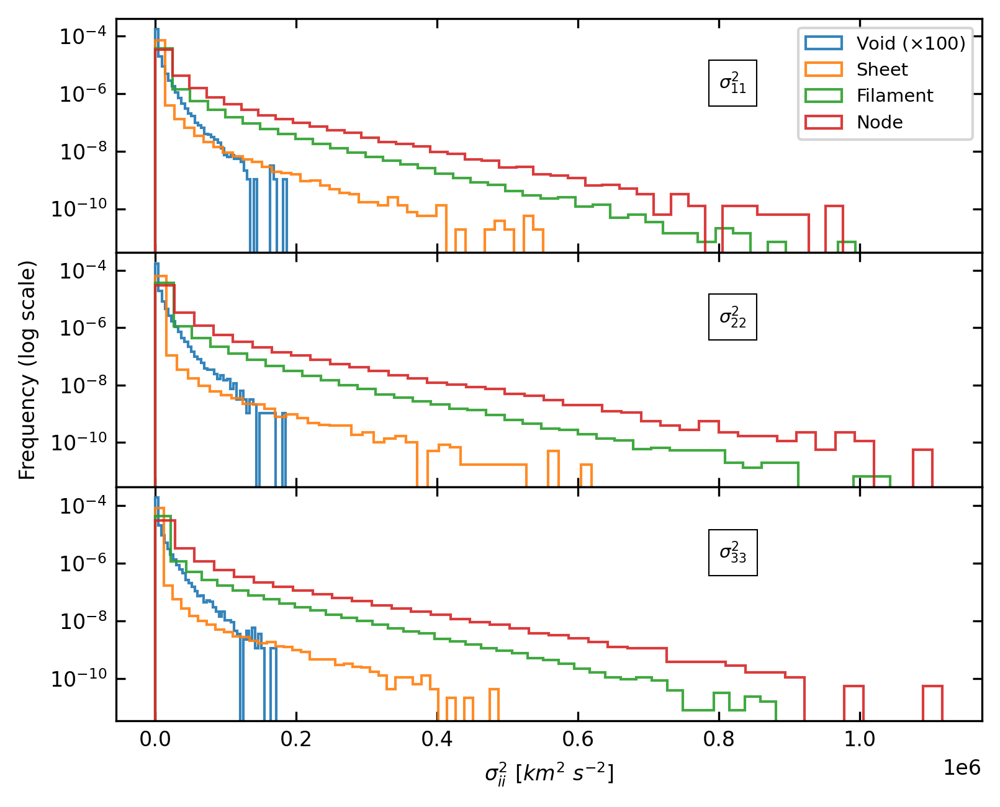

In [49]:
fig, axs = plt.subplots(3, 1, figsize=(6, 5), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

for i in range(3):
    axs[i].hist(data_v[:, i]*100, bins=40, log=True, density=True, alpha=0.9, label=r'Void $(\times 100)$', histtype='step')
    axs[i].hist(data_s[:, i], bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
    axs[i].hist(data_f[:, i], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
    axs[i].hist(data_n[:, i], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')
    axs[i].text(0.8e6, 1.5e-6, r"$\sigma^2_{" + str(i+1) + str(i+1) + "}$", fontsize=7, bbox=dict(facecolor='white', lw=0.5))
#     axs[i].grid(True, alpha = 0.2)

# axs[0].set_title('Velocity dispersion components in all environments')
axs[1].set_ylabel('Frequency (log scale)')
axs[0].legend(fontsize=7)

axs[-1].set_xlabel('$\sigma^2_{ii}~[km^2~s^{-2}]$')

plt.show()


In [50]:
data_v_diag.shape

(202004, 3)

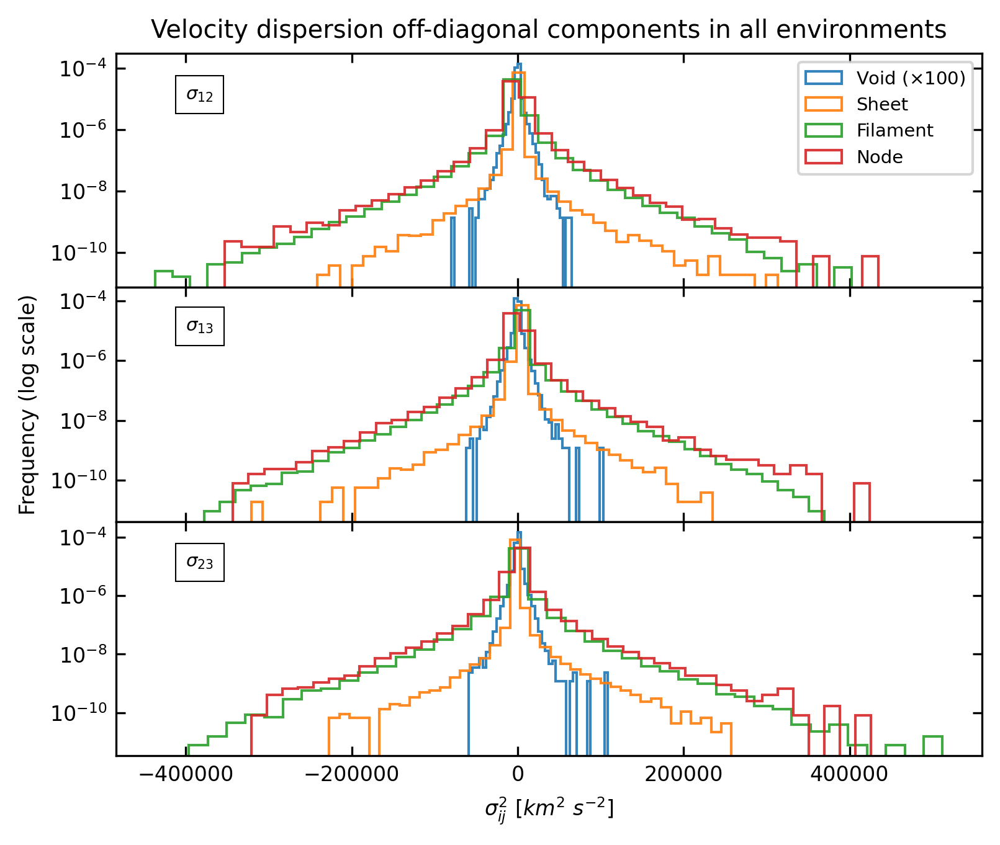

In [51]:
fig, axs = plt.subplots(3, 1, figsize=(6, 5), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

title = ['\sigma_{12}', '\sigma_{13}', '\sigma_{23}']

for i in range(3):
    axs[i].hist(data_v_diag[:, i] * 100, bins=40, log=True, density=True, alpha=0.9, label=r'Void $(\times 100)$', histtype='step')
    axs[i].hist(data_s_diag[:, i], bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
    axs[i].hist(data_f_diag[:, i], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
    axs[i].hist(data_n_diag[:, i], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')
    axs[i].text(-4e5, 1e-5, r'${}$'.format(title[i]), fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

axs[0].set_title('Velocity dispersion off-diagonal components in all environments')
axs[1].set_ylabel('Frequency (log scale)')
axs[0].legend(fontsize=7)

axs[-1].set_xlabel('$\sigma^2_{ij}~[km^2~s^{-2}]$')

plt.show()


In [71]:
def del_ind(data, index):
    
    mask = np.ones(len(data), dtype = bool)
    mask[index] = False
    result = data[mask, ...]
    
    return result

In [73]:
new_data_s = del_ind(data_s, 1702377)

In [74]:
new_data_s_diag = del_ind(data_s_diag, 1702377)

In [75]:
new_data_f = del_ind(data_f, [2252721, 2778594])

In [76]:
new_data_f_diag = del_ind(data_f_diag, [2252721, 2778594])

In [92]:
len(new_data_f_diag)

5807356

In [93]:
len(data_f_diag)

5807358

/tmp/ipykernel_3475133/1645528038.py:7: RuntimeWarning: invalid value encountered in sqrt
  axs[0].hist(new_data_s_diag[:, 0] / (np.sqrt(new_data_s[:, 0] * new_data_s[:, 1])), bins=40, log=False, density=True, alpha=0.9, label='Sheet', histtype='step')
/tmp/ipykernel_3475133/1645528038.py:13: RuntimeWarning: invalid value encountered in sqrt
  axs[1].hist(new_data_s_diag[:, 1] / (np.sqrt(new_data_s[:, 0] * new_data_s[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Sheet', histtype='step')
/tmp/ipykernel_3475133/1645528038.py:14: RuntimeWarning: invalid value encountered in sqrt
  axs[1].hist(new_data_f_diag[:, 1] / (np.sqrt(new_data_f[:, 0] * new_data_f[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Filament', histtype='step')
/tmp/ipykernel_3475133/1645528038.py:21: RuntimeWarning: invalid value encountered in sqrt
  axs[2].hist(new_data_f_diag[:, 2] / (np.sqrt(new_data_f[:, 1] * new_data_f[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Filamen

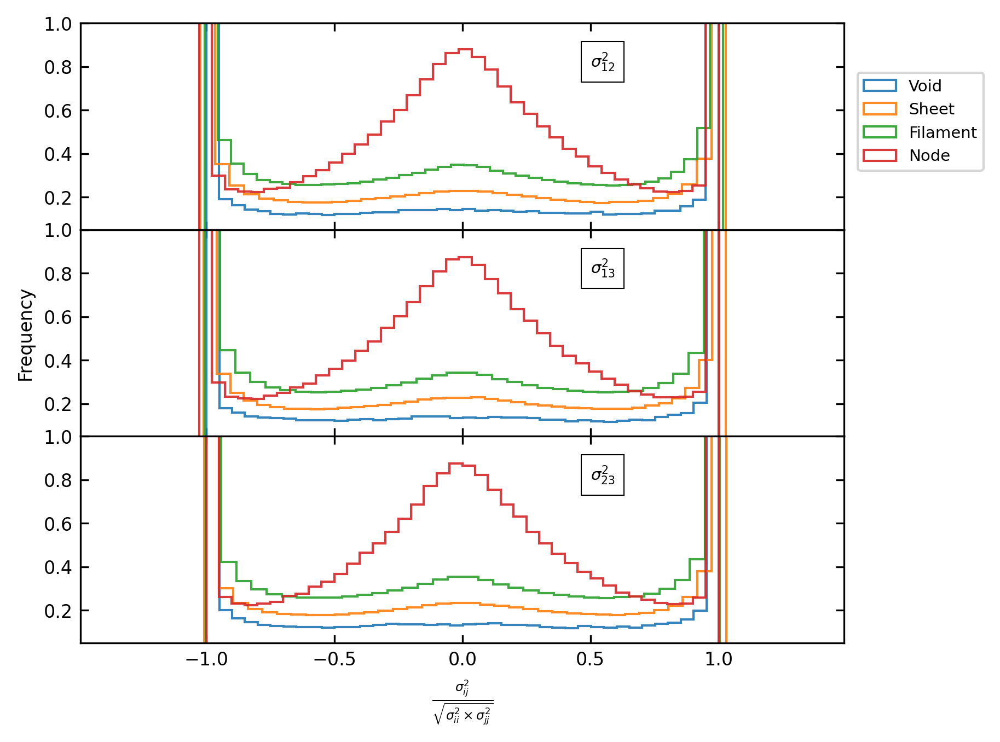

In [144]:
fig, axs = plt.subplots(3, 1, figsize=(6, 5), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

title = ['\sigma^2_{12}', '\sigma^2_{13}', '\sigma^2_{23}']

axs[0].hist(data_v_diag[:, 0] / (np.sqrt(data_v[:, 0] * data_v[:, 1])), bins=40, log=False, density=True, alpha=0.9, label=r'Void', histtype='step')
axs[0].hist(new_data_s_diag[:, 0] / (np.sqrt(new_data_s[:, 0] * new_data_s[:, 1])), bins=40, log=False, density=True, alpha=0.9, label='Sheet', histtype='step')
axs[0].hist(new_data_f_diag[:, 0] / (np.sqrt(new_data_f[:, 0] * new_data_f[:, 1])), bins=40, log=False, density=True, alpha=0.9, label='Filament', histtype='step')
axs[0].hist(data_n_diag[:, 0] / (np.sqrt(data_n[:, 0] * data_n[:, 1])), bins=40, log=False, density=True, alpha=0.9, label='Node', histtype='step')
axs[0].text(0.5, 0.8, r'${}$'.format(title[0]), fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

axs[1].hist(data_v_diag[:, 1] / (np.sqrt(data_v[:, 0] * data_v[:, 2])), bins=40, log=False, density=True, alpha=0.9, label=r'Void', histtype='step')
axs[1].hist(new_data_s_diag[:, 1] / (np.sqrt(new_data_s[:, 0] * new_data_s[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Sheet', histtype='step')
axs[1].hist(new_data_f_diag[:, 1] / (np.sqrt(new_data_f[:, 0] * new_data_f[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Filament', histtype='step')
axs[1].hist(data_n_diag[:, 1] / (np.sqrt(data_n[:, 0] * data_n[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Node', histtype='step')
axs[1].text(0.5, 0.8, r'${}$'.format(title[1]), fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))


axs[2].hist(data_v_diag[:, 2] / (np.sqrt(data_v[:, 1] * data_v[:, 2])), bins=40, log=False, density=True, alpha=0.9, label=r'Void', histtype='step')
axs[2].hist(new_data_s_diag[:, 2] / (np.sqrt(new_data_s[:, 1] * new_data_s[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Sheet', histtype='step')
axs[2].hist(new_data_f_diag[:, 2] / (np.sqrt(new_data_f[:, 1] * new_data_f[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Filament', histtype='step')
axs[2].hist(data_n_diag[:, 2] / (np.sqrt(data_n[:, 1] * data_n[:, 2])), bins=40, log=False, density=True, alpha=0.9, label='Node', histtype='step')
axs[2].text(0.5, 0.8, r'${}$'.format(title[2]), fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))


# axs[0].set_title('Velocity dispersion off-diagonal components in all environments')
axs[1].set_ylabel('Frequency')
axs[0].legend(fontsize=7, ncol = 1, loc = 'upper center', bbox_to_anchor = (1.1, 0.8))

axs[-1].set_xlabel(r'$\frac{\sigma^2_{ij}}{\sqrt{\sigma^2_{ii} \times \sigma^2_{jj}}}$')

axs[0].set_ylim(0.5e-1, 1)
axs[1].set_ylim(0.5e-1, 1)
axs[2].set_ylim(0.5e-1, 1)

plt.show()


In [82]:
data_f_diag[:, 0] / np.sqrt((data_f[:, 0] * data_f[:, 1]) + 1e-20)

array([-0.8481394 ,  0.11801325, -0.46359179, ...,  0.09213324,
       -1.        , -1.        ])

In [57]:
np.array(eign_class['sheet'])[0]

array([ 0.14456867, -0.17146937, -0.71799612])

In [61]:
# for i in range(len(data_f[:, 1])):
#     try:
#         denominator = data_f[i, 1]
#         # Check if denominator is zero or near zero
#         if denominator == 0 or abs(denominator) < 1e-15:
#             print(f"Encountered zero or near-zero denominator at index {i}")
#             continue  # Skip to the next iteration
#         result = np.log(np.abs(data_f[i, 0] / denominator))
#         # Use 'result' variable if needed
#     except Exception as e:
#         print(f"Encountered an exception at index {i}: {e}")

In [62]:
x = np.where(data_s[:, 2] > 0)[0]

In [60]:
np.min(data_s[x, 2])

5.4569682106375694e-12

In [61]:
np.where(data_s[:, 2] == 5.4569682106375694e-12)

(array([1173286]),)

In [62]:
np.min(np.abs(data_f[1173286, 0] / (data_f[1173286, 1] + 1e-20)) + 1e-20)

1.8557741355813915

In [63]:
# for i in range(len(data_f[:, 0])):
#     try:
#         fraction = np.log(np.abs(data_f[i, 0] / data_f[i, 1]) + 1e-20)
# #         print(f"Fraction at index {i}: {fraction}")
    
#     except ZeroDivisionError:
#         print(f"Division by zero error at index {i}")
        
#     except Exception as e:
#         print(f"Warning at index {i}: {e}")

In [64]:
# for i in range(len(data_f[:, 1])):
#     try:
#         np.log(np.abs(data_f[i, 0] / (data_f[i, 1] + 1e-20)))
    
#     except:
#         print(i)

In [65]:
3 * np.sqrt((data_v[:, 0] - data_v[:, 1])**2 + (data_v[:, 1] - data_v[:, 2])**2 + (data_v[:, 0] - data_v[:, 2])**2)# / np.sum(data_v[:, 0], data_v[:, 1], data_v[:, 2])

array([  1.52921168,  24.80231543,  27.3215985 , ...,  21.77778757,
       401.86370339,   3.10660688])

In [66]:
3 * ((1 - 1)**2 + (1-1)**2 + (1 - 1)**2)**0.5 / 3

0.0

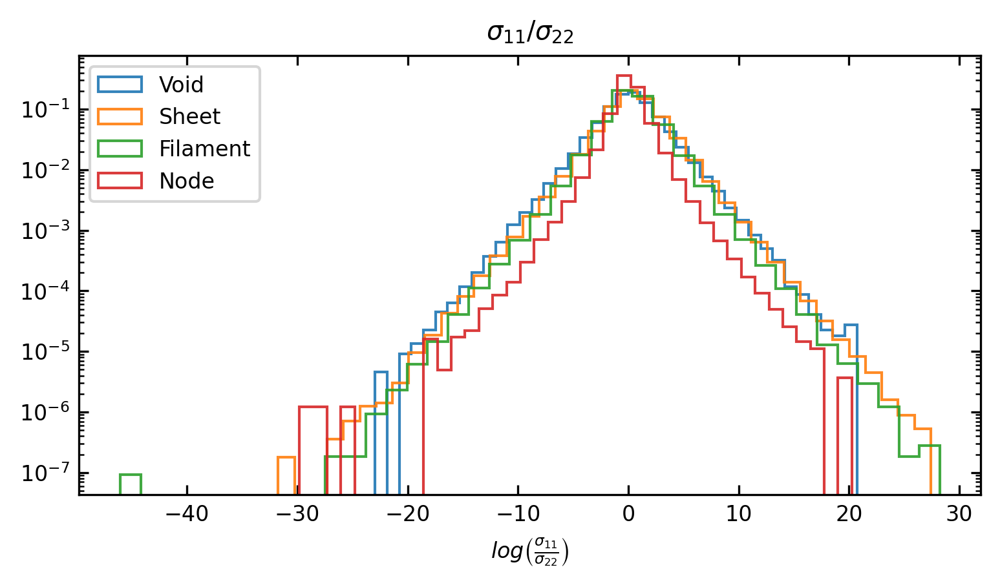

In [63]:
plt.figure(figsize = (6, 3), dpi = 300)

plt.hist(np.log(np.abs(data_v[:, 0] / data_v[:, 1]) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
plt.hist(np.log(np.abs(data_s[:, 0] / data_s[:, 1]) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
plt.hist(np.log(np.abs(data_f[:, 0] / data_f[:, 1]) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(np.log(np.abs(data_n[:, 0] / data_n[:, 1]) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')
#         axs[i].text(0.6e6, 1e-4, f"{['First component', 'Second component', 'Third component'][i]}", fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

plt.title(r'$\sigma_{11} / \sigma_{22}$')
plt.xlabel(r'$log\left(\frac{\sigma_{11}}{\sigma_{22}}\right)$')
plt.legend()
plt.show()

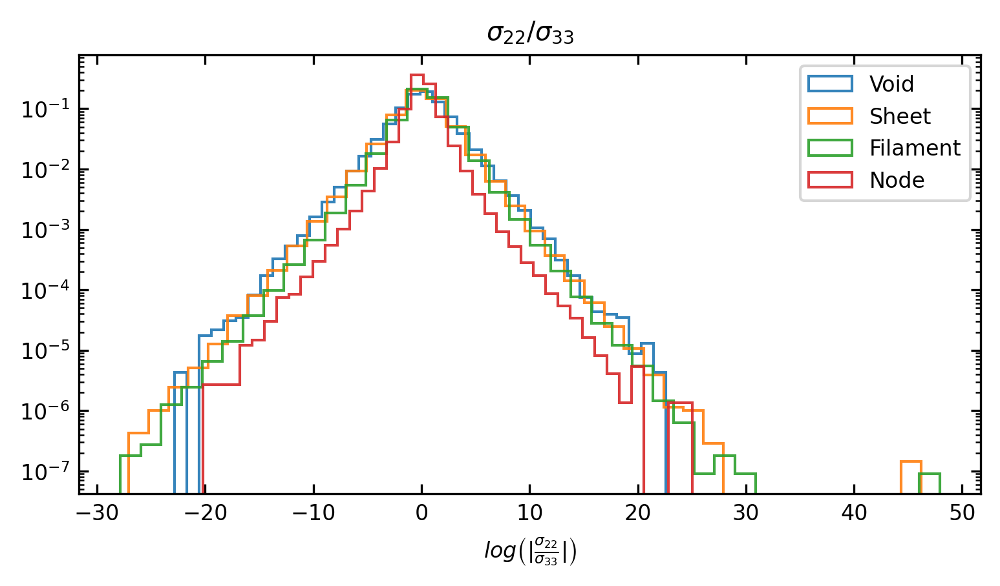

In [64]:
plt.figure(figsize = (6, 3), dpi = 300)

plt.hist(np.log(np.abs(data_v[:, 1] / data_v[:, 2]) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
plt.hist(np.log(np.abs(data_s[:, 1] / (data_s[:, 2] + 1e-20)) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
plt.hist(np.log(np.abs(data_f[:, 1] / (data_f[:, 2] + 1e-20)) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(np.log(np.abs(data_n[:, 1] / data_n[:, 2]) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')
#         axs[i].text(0.6e6, 1e-4, f"{['First component', 'Second component', 'Third component'][i]}", fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

plt.title(r'$\sigma_{22} / \sigma_{33}$')
plt.xlabel(r'$log\left(|\frac{\sigma_{22}}{\sigma_{33}}|\right)$')
plt.legend()
plt.show()

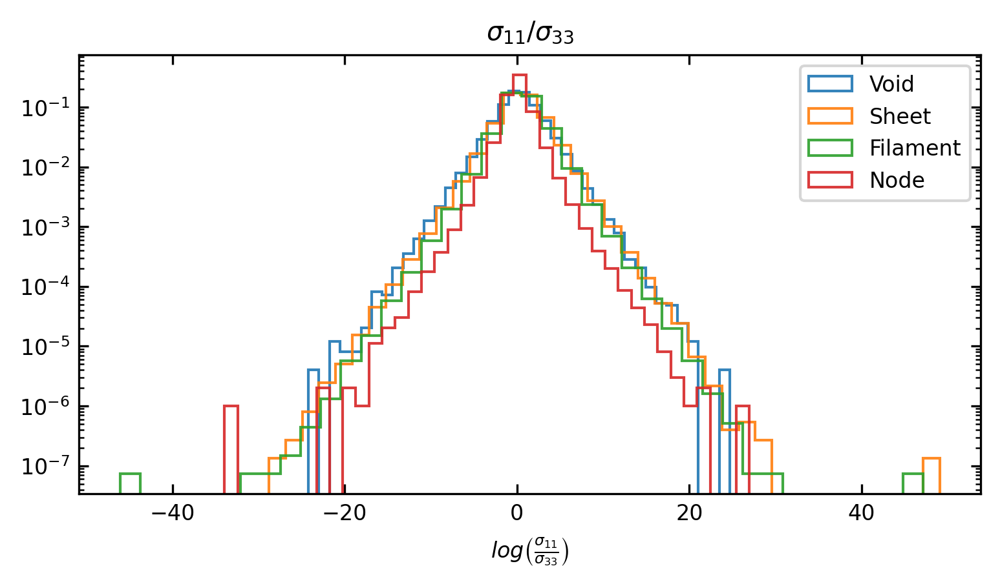

In [65]:
plt.figure(figsize = (6, 3), dpi = 300)

plt.hist(np.log(np.abs(data_v[:, 0] / data_v[:, 2]) + 1e-20), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
plt.hist(np.log(np.abs(data_s[:, 0] / (data_s[:, 2] + 1e-20) + 1e-20)), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
plt.hist(np.log(np.abs(data_f[:, 0] / (data_f[:, 2] + 1e-20) + 1e-20)), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(np.log(np.abs(data_n[:, 0] / (data_n[:, 2] + 1e-20))), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')
#         axs[i].text(0.6e6, 1e-4, f"{['First component', 'Second component', 'Third component'][i]}", fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

plt.title(r'$\sigma_{11} / \sigma_{33}$')
plt.xlabel(r'$log\left(\frac{\sigma_{11}}{\sigma_{33}}\right)$')
plt.legend()
plt.show()

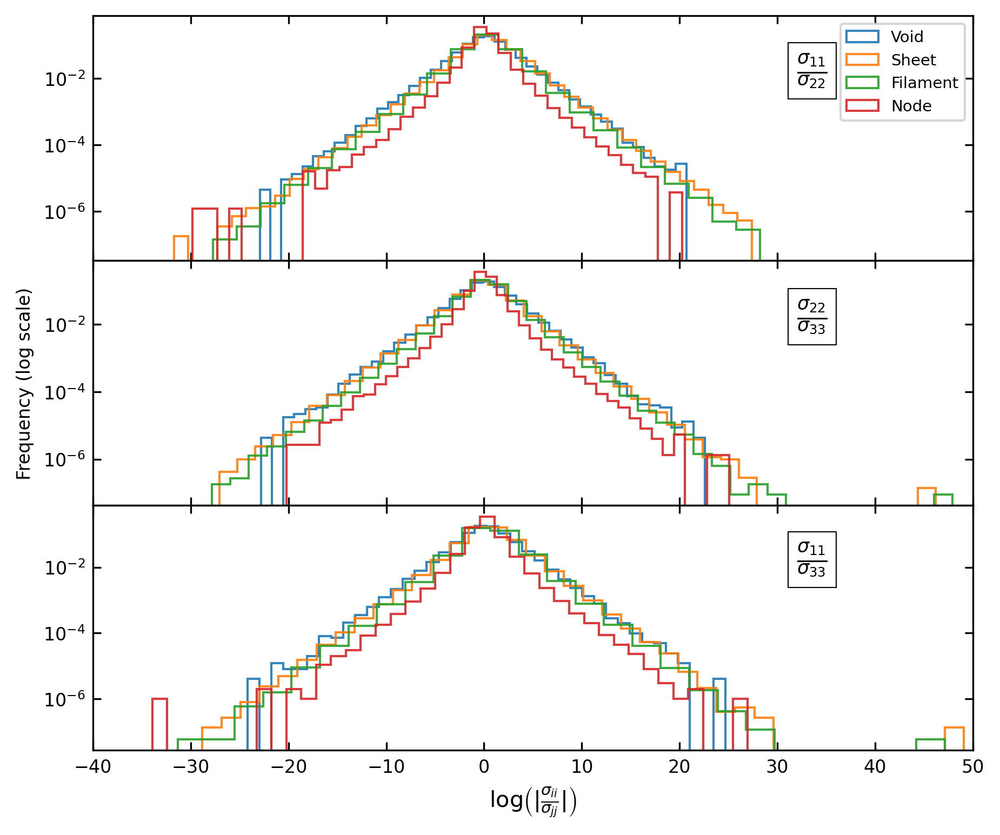

In [66]:
fig, axs = plt.subplots(3, 1, figsize=(7, 6), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

for i in range(3):
    try:
        axs[i].hist(np.log(np.abs(data_v[:, i] / data_v[:, i+1]) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
        axs[i].hist(np.log(np.abs(data_s[:, i] / (data_s[:, i+1] + 1e-20)) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
        axs[i].hist(np.log(np.abs(data_f[:, i] / (data_f[:, i+1] + 1e-20)) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
        axs[i].hist(np.log(np.abs(data_n[:, i] / data_n[:, i+1]) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
        axs[i].text(32, 1e-2, r'{}'.format([r'$\frac{\sigma_{11}}{\sigma_{22}}$', r'$\frac{\sigma_{22}}{\sigma_{33}}$', r'$\frac{\sigma_{11}}{\sigma_{33}}$'][i]), fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))

    
    except:
        axs[i].hist(np.log(np.abs(data_v[:, 0] / data_v[:, i]) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
        axs[i].hist(np.log(np.abs(data_s[:, 0] / (data_s[:, i] + 1e-20)) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
        axs[i].hist(np.log(np.abs(data_f[:, 0] / (data_f[:, i] + 1e-20)) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
        axs[i].hist(np.log(np.abs(data_n[:, 0] / data_n[:, i]) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
        axs[i].text(32, 1e-2, r'{}'.format([r'$\frac{\sigma_{11}}{\sigma_{22}}$', r'$\frac{\sigma_{22}}{\sigma_{33}}$', r'$\frac{\sigma_{11}}{\sigma_{33}}$'][i]), fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))
        
# axs[0].set_title('Velocity dispersion components in all environments')
axs[1].set_ylabel('Frequency (log scale)')
axs[0].legend(fontsize=7)

axs[-1].set_xlim(-40, 50)

axs[-1].set_xlabel(r'log$\left(|\frac{\sigma_{ii}}{\sigma_{jj}}|\right)$', fontsize = 10)

plt.show()


In [110]:
def calculation2(data):
#     return (data[:, 0]) / ((data[:, 0] + data[:, 1] + data[:, 2])/3)
    return (data[:, 0] - data[:, 1]) / (data[:, 0] + data[:, 1] + data[:, 2])
#     return (data[:, 0] - (data[:, 0] + data[:, 1] + data[:, 2])/3) / ((data[:, 0] + data[:, 1] + data[:, 2])/3)

In [111]:
def calculation3(data):
#     return (data[:, 1]) / ((data[:, 0] + data[:, 1] + data[:, 2])/3)
    return (data[:, 1] - data[:, 2]) / (data[:, 0] + data[:, 1] + data[:, 2])
#     return (data[:, 1] - (data[:, 0] + data[:, 1] + data[:, 2])/3) / ((data[:, 0] + data[:, 1] + data[:, 2])/3)

In [112]:
def calculation4(data):
#     return (data[:, 2]) / ((data[:, 0] + data[:, 1] + data[:, 2])/3)
    return (data[:, 0] - data[:, 2]) / (data[:, 0] + data[:, 1] + data[:, 2])
#     return (data[:, 2] - (data[:, 0] + data[:, 1] + data[:, 2])/3) / ((data[:, 0] + data[:, 1] + data[:, 2])/3)

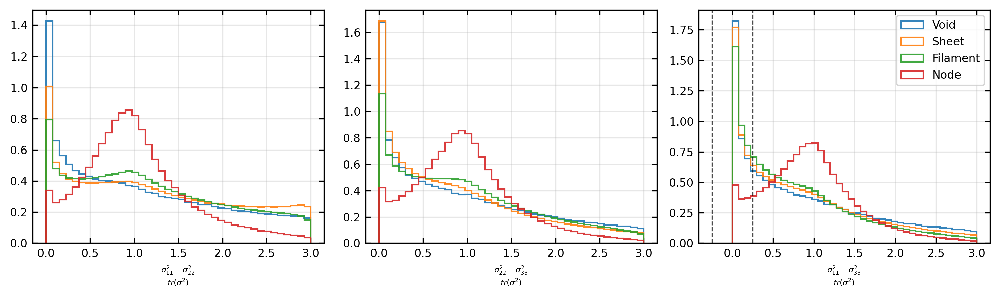

In [62]:
import matplotlib.gridspec as gridspec

# Create a figure and gridspec layout
fig = plt.figure(figsize=(10, 3), dpi=300)
gs = gridspec.GridSpec(1, 3)

ax1 = plt.subplot(gs[0, 0])
ax1.hist(calculation2(data_v), bins=40, log=False, density=True, alpha=0.9, label='Void', histtype='step')
ax1.hist(calculation2(data_s), bins=40, log=False, density=True, alpha=0.9, label='Sheet', histtype='step')
ax1.hist(calculation2(data_f), bins=40, log=False, density=True, alpha=0.9, label='Filament', histtype='step')
ax1.hist(calculation2(data_n), bins=40, log=False, density=True, alpha=0.9, label='Node', histtype='step')    
ax1.set_xlabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
# ax1.set_xlabel(r'$\frac{\sigma^2_{11}}{tr(\sigma^2)~/~3}$')
# ax1.set_xlabel(r'$\frac{\sigma^2_{11} - (tr(\sigma^2)/3)}{tr(\sigma^2)~/~3}$')
ax1.grid(True, alpha = 0.3)

ax2 = plt.subplot(gs[0, 1])
ax2.hist(calculation3(data_v), bins=40, log=False, density=True, alpha=0.9, label='Void', histtype='step')
ax2.hist(calculation3(data_s), bins=40, log=False, density=True, alpha=0.9, label='Sheet', histtype='step')
ax2.hist(calculation3(data_f), bins=40, log=False, density=True, alpha=0.9, label='Filament', histtype='step')
ax2.hist(calculation3(data_n), bins=40, log=False, density=True, alpha=0.9, label='Node', histtype='step')    
ax2.set_xlabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')
# ax2.set_xlabel(r'$\frac{\sigma^2_{22}}{tr(\sigma^2)~/~3}$')
# ax2.set_xlabel(r'$\frac{\sigma^2_{22} - (tr(\sigma^2)/3)}{tr(\sigma^2)~/~3}$')
ax2.grid(True, alpha = 0.3)

ax3 = plt.subplot(gs[0, 2])
ax3.hist(calculation4(data_v), bins=40, log=False, density=True, alpha=0.9, label='Void', histtype='step')
ax3.hist(calculation4(data_s), bins=40, log=False, density=True, alpha=0.9, label='Sheet', histtype='step')
ax3.hist(calculation4(data_f), bins=40, log=False, density=True, alpha=0.9, label='Filament', histtype='step')
ax3.hist(calculation4(data_n), bins=40, log=False, density=True, alpha=0.9, label='Node', histtype='step')    
ax3.set_xlabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')
# ax3.set_xlabel(r'$\frac{\sigma^2_{33}}{tr(\sigma^2)~/~3}$')
# ax3.set_xlabel(r'$\frac{\sigma^2_{33} - (tr(\sigma^2)/3)}{tr(\sigma^2)~/~3}$')
ax3.axvline(0.25, ls = '--', lw = 0.8, color = 'black', alpha = 0.7)
ax3.axvline(-0.25, ls = '--', lw = 0.8, color = 'black', alpha = 0.7)
ax3.grid(True, alpha = 0.3)

ax3.legend()

plt.tight_layout()
plt.show()

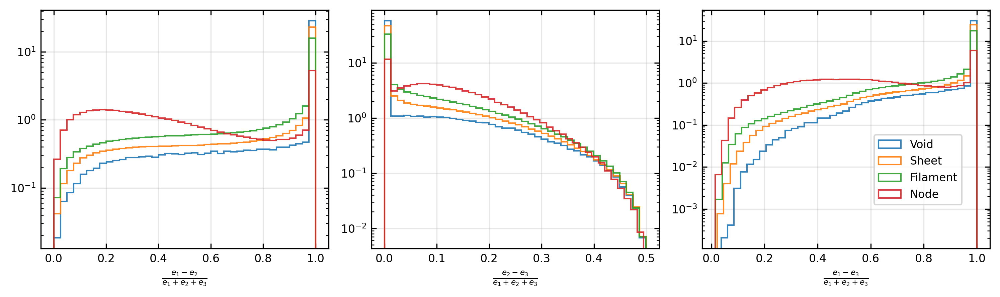

In [116]:
import matplotlib.gridspec as gridspec

# Create a figure and gridspec layout
fig = plt.figure(figsize=(10, 3), dpi=300)
gs = gridspec.GridSpec(1, 3)

ax1 = plt.subplot(gs[0, 0])
ax1.hist(calculation2(np.array(vdisp_eval_class['void'])), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
ax1.hist(calculation2(np.array(vdisp_eval_class['sheet'])), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
ax1.hist(calculation2(np.array(vdisp_eval_class['filament'])), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
ax1.hist(calculation2(np.array(vdisp_eval_class['node'])), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
ax1.set_xlabel(r'$\frac{e_{1} - e_{2}}{e_1 + e_2 + e_3}$')
# ax1.set_xlabel(r'$\frac{e_{1}}{(e_1 + e_2 + e_3)~/~3}$')
# ax1.set_xlabel(r'$\frac{\sigma^2_{11} - (tr(\sigma^2)/3)}{tr(\sigma^2)~/~3}$')
ax1.grid(True, alpha = 0.3)

ax2 = plt.subplot(gs[0, 1])
ax2.hist(calculation3(np.array(vdisp_eval_class['void'])), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
ax2.hist(calculation3(np.array(vdisp_eval_class['sheet'])), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
ax2.hist(calculation3(np.array(vdisp_eval_class['filament'])), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
ax2.hist(calculation3(np.array(vdisp_eval_class['node'])), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
ax2.set_xlabel(r'$\frac{e_{2} - e_{3}}{e_1 + e_2 + e_3}$')
# ax2.set_xlabel(r'$\frac{e_{2}}{(e_1 + e_2 + e_3)~/~3}$')
# ax2.set_xlabel(r'$\frac{\sigma^2_{22} - (tr(\sigma^2)/3)}{tr(\sigma^2)~/~3}$')
ax2.grid(True, alpha = 0.3)

ax3 = plt.subplot(gs[0, 2])
ax3.hist(calculation4(np.array(vdisp_eval_class['void'])), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
ax3.hist(calculation4(np.array(vdisp_eval_class['sheet'])), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
ax3.hist(calculation4(np.array(vdisp_eval_class['filament'])), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
ax3.hist(calculation4(np.array(vdisp_eval_class['node'])), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
ax3.set_xlabel(r'$\frac{e_{1} - e_{3}}{e_1 + e_2 + e_3}$')
# ax3.set_xlabel(r'$\frac{e_{3}}{(e_1 + e_2 + e_3)~/~3}$')
# ax3.set_xlabel(r'$\frac{\sigma^2_{33} - (tr(\sigma^2)/3)}{tr(\sigma^2)~/~3}$')
# ax3.axvline(0.25, ls = '--', lw = 0.8, color = 'black', alpha = 0.7)
# ax3.axvline(-0.25, ls = '--', lw = 0.8, color = 'black', alpha = 0.7)
ax3.grid(True, alpha = 0.3)

ax3.legend(bbox_to_anchor = (0.75, 0.5), loc = 'upper center')
# ax3.legend(bbox_to_anchor = (0.82, 1), loc = 'upper center')

plt.tight_layout()
plt.show()

In [65]:
def cal_corcoeff(x, y):
    k_coeff = stats.kendalltau(x, y, method = 'auto')
    s_coeff = stats.spearmanr(x, y)
    p_coeff = stats.pearsonr(x, y)
    
    return p_coeff, s_coeff, k_coeff

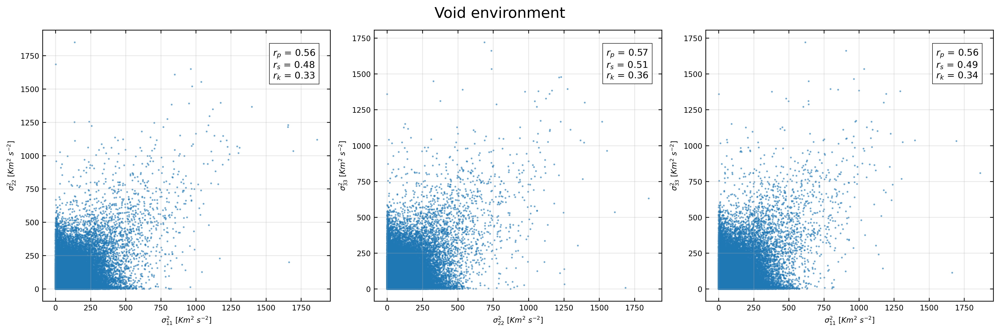

In [94]:
fig = plt.figure(figsize=(15, 5), dpi=300)
gs = gridspec.GridSpec(1, 3)

rp, rs, rk = cal_corcoeff(data_v[:, 0], data_v[:, 1])
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(data_v[:, 0], data_v[:, 1], s = 1, alpha = 0.5)
ax1.set_xlabel(r'$\sigma^2_{11}~[Km^2~s^{-2}]$')
ax1.set_ylabel(r'$\sigma^2_{22}~[Km^2~s^{-2}]$')
ax1.grid(True, alpha = 0.3)
ax1.text(1550, 1580, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

rp, rs, rk = cal_corcoeff(data_v[:, 1], data_v[:, 2])
ax2 = plt.subplot(gs[0, 1])
ax2.scatter(data_v[:, 1], data_v[:, 2], s = 1, alpha = 0.5)
ax2.set_xlabel(r'$\sigma^2_{22}~[Km^2~s^{-2}]$')
ax2.set_ylabel(r'$\sigma^2_{33}~[Km^2~s^{-2}]$')
ax2.grid(True, alpha = 0.3)
ax2.text(1550, 1470, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

rp, rs, rk = cal_corcoeff(data_v[:, 0], data_v[:, 2])
ax3 = plt.subplot(gs[0, 2])
ax3.scatter(data_v[:, 0], data_v[:, 2], s = 1, alpha = 0.5)
ax3.set_xlabel(r'$\sigma^2_{11}~[Km^2~s^{-2}]$')
ax3.set_ylabel(r'$\sigma^2_{33}~[Km^2~s^{-2}]$')
ax3.grid(True, alpha = 0.3)
ax3.text(1550, 1470, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

# ax3.legend(bbox_to_anchor = (0.82, 1), loc = 'upper center')
fig.suptitle('Void environment', fontsize = 16)

plt.tight_layout()
plt.show()

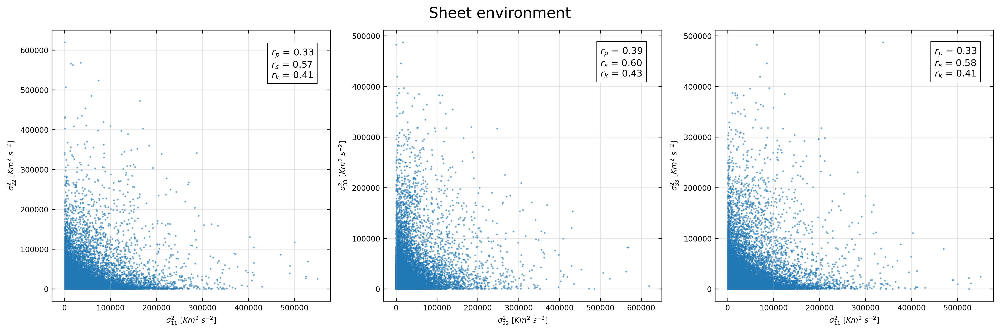

In [108]:
fig = plt.figure(figsize=(15, 5), dpi=300)
gs = gridspec.GridSpec(1, 3)

rp, rs, rk = cal_corcoeff(data_s[:, 0], data_s[:, 1])
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(data_s[:, 0], data_s[:, 1], s = 1, alpha = 0.5)
ax1.set_xlabel(r'$\sigma^2_{11}~[Km^2~s^{-2}]$')
ax1.set_ylabel(r'$\sigma^2_{22}~[Km^2~s^{-2}]$')
ax1.grid(True, alpha = 0.3)
ax1.text(0.45e6, 0.53e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

rp, rs, rk = cal_corcoeff(data_s[:, 1], data_s[:, 2])
ax2 = plt.subplot(gs[0, 1])
ax2.scatter(data_s[:, 1], data_s[:, 2], s = 1, alpha = 0.5)
ax2.set_xlabel(r'$\sigma^2_{22}~[Km^2~s^{-2}]$')
ax2.set_ylabel(r'$\sigma^2_{33}~[Km^2~s^{-2}]$')
ax2.grid(True, alpha = 0.3)
ax2.text(0.5e6, 0.42e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

rp, rs, rk = cal_corcoeff(data_s[:, 0], data_s[:, 2])
ax3 = plt.subplot(gs[0, 2])
ax3.scatter(data_s[:, 0], data_s[:, 2], s = 1, alpha = 0.5)
ax3.set_xlabel(r'$\sigma^2_{11}~[Km^2~s^{-2}]$')
ax3.set_ylabel(r'$\sigma^2_{33}~[Km^2~s^{-2}]$')
ax3.grid(True, alpha = 0.3)
ax3.text(0.45e6, 0.42e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

# ax3.legend(bbox_to_anchor = (0.82, 1), loc = 'upper center')
fig.suptitle('Sheet environment', fontsize = 16)

plt.tight_layout()
plt.show()

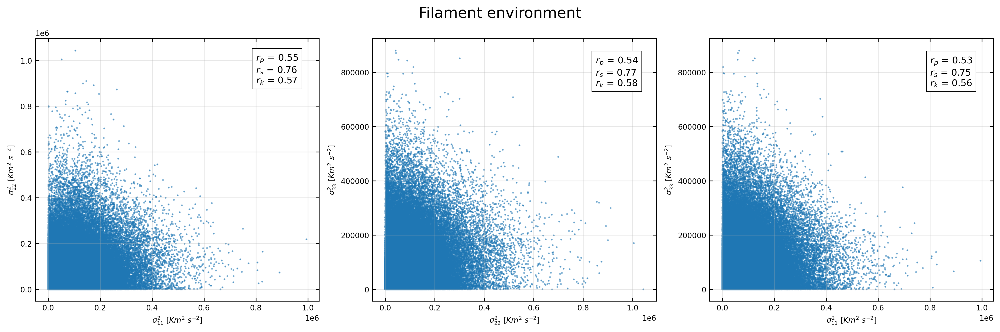

In [109]:
fig = plt.figure(figsize=(15, 5), dpi=300)
gs = gridspec.GridSpec(1, 3)

rp, rs, rk = cal_corcoeff(data_f[:, 0], data_f[:, 1])
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(data_f[:, 0], data_f[:, 1], s = 1, alpha = 0.5)
ax1.set_xlabel(r'$\sigma^2_{11}~[Km^2~s^{-2}]$')
ax1.set_ylabel(r'$\sigma^2_{22}~[Km^2~s^{-2}]$')
ax1.grid(True, alpha = 0.3)
ax1.text(0.8e6, 0.9e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

rp, rs, rk = cal_corcoeff(data_f[:, 1], data_f[:, 2])
ax2 = plt.subplot(gs[0, 1])
ax2.scatter(data_f[:, 1], data_f[:, 2], s = 1, alpha = 0.5)
ax2.set_xlabel(r'$\sigma^2_{22}~[Km^2~s^{-2}]$')
ax2.set_ylabel(r'$\sigma^2_{33}~[Km^2~s^{-2}]$')
ax2.grid(True, alpha = 0.3)
ax2.text(0.85e6, 0.75e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

rp, rs, rk = cal_corcoeff(data_f[:, 0], data_f[:, 2])
ax3 = plt.subplot(gs[0, 2])
ax3.scatter(data_f[:, 0], data_f[:, 2], s = 1, alpha = 0.5)
ax3.set_xlabel(r'$\sigma^2_{11}~[Km^2~s^{-2}]$')
ax3.set_ylabel(r'$\sigma^2_{33}~[Km^2~s^{-2}]$')
ax3.grid(True, alpha = 0.3)
ax3.text(0.8e6, 0.75e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

# ax3.legend(bbox_to_anchor = (0.82, 1), loc = 'upper center')
fig.suptitle('Filament environment', fontsize = 16)

plt.tight_layout()
plt.show()

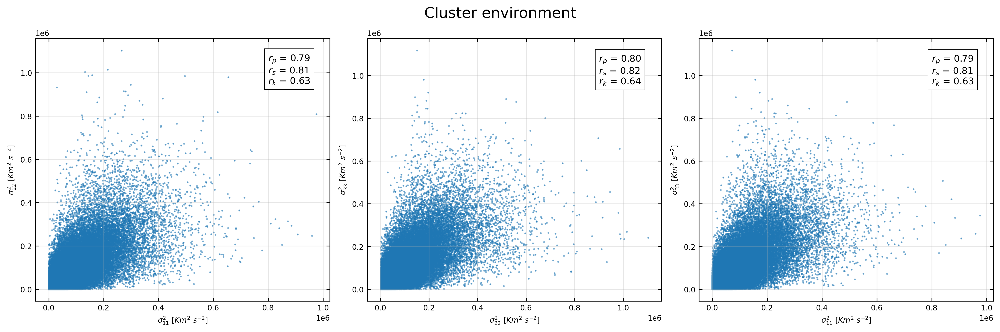

In [101]:
fig = plt.figure(figsize=(15, 5), dpi=300)
gs = gridspec.GridSpec(1, 3)

rp, rs, rk = cal_corcoeff(data_n[:, 0], data_n[:, 1])
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(data_n[:, 0], data_n[:, 1], s = 1, alpha = 0.5)
ax1.set_xlabel(r'$\sigma^2_{11}~[Km^2~s^{-2}]$')
ax1.set_ylabel(r'$\sigma^2_{22}~[Km^2~s^{-2}]$')
ax1.grid(True, alpha = 0.3)
ax1.text(0.8e6, 0.95e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

rp, rs, rk = cal_corcoeff(data_n[:, 1], data_n[:, 2])
ax2 = plt.subplot(gs[0, 1])
ax2.scatter(data_n[:, 1], data_n[:, 2], s = 1, alpha = 0.5)
ax2.set_xlabel(r'$\sigma^2_{22}~[Km^2~s^{-2}]$')
ax2.set_ylabel(r'$\sigma^2_{33}~[Km^2~s^{-2}]$')
ax2.grid(True, alpha = 0.3)
ax2.text(0.9e6, 0.96e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

rp, rs, rk = cal_corcoeff(data_n[:, 0], data_n[:, 2])
ax3 = plt.subplot(gs[0, 2])
ax3.scatter(data_n[:, 0], data_n[:, 2], s = 1, alpha = 0.5)
ax3.set_xlabel(r'$\sigma^2_{11}~[Km^2~s^{-2}]$')
ax3.set_ylabel(r'$\sigma^2_{33}~[Km^2~s^{-2}]$')
ax3.grid(True, alpha = 0.3)
ax3.text(0.8e6, 0.96e6, r"$r_p$ = {rp:.2f}".format(rp = rp[0]) + '\n' + r"$r_s$" + ' = {rs:.2f} \n'.format(rs = rs[0]) + r"$r_k$ = {rk:.2f}".format(rk=rk[0]), 
         fontsize = 10, bbox=dict(facecolor='white', lw = 0.5))

# ax3.legend(bbox_to_anchor = (0.82, 1), loc = 'upper center')
fig.suptitle('Cluster environment', fontsize = 16)

plt.tight_layout()
plt.show()

In [77]:
len(np.where(np.abs(calculation4(data_n)) <= 0.25)[0]) / len(calculation4(data_n))

0.6045924580265389

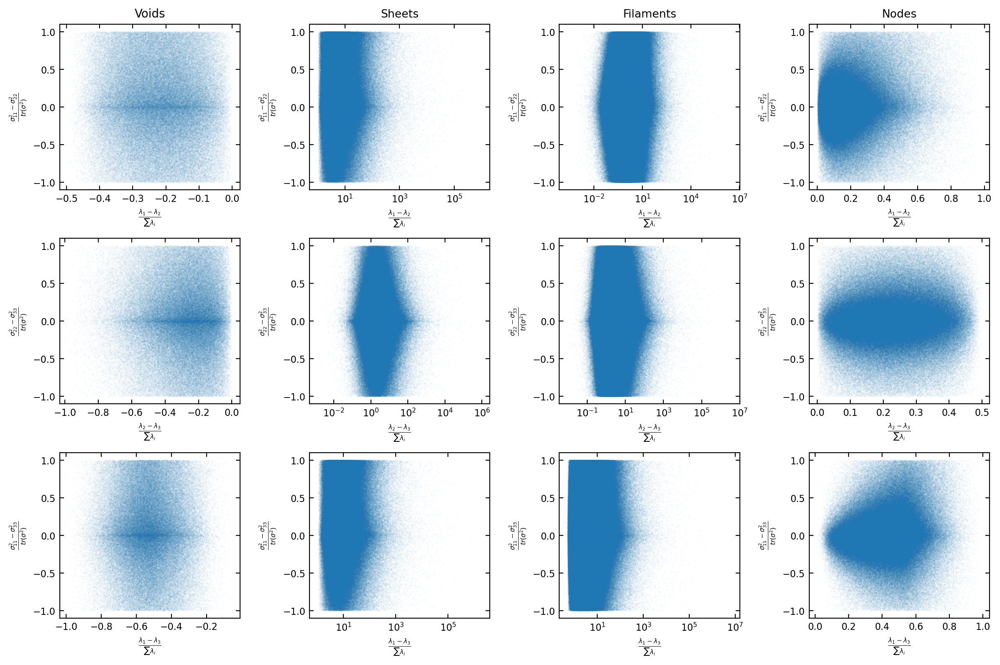

In [74]:
import matplotlib.gridspec as gridspec

# Create a figure and gridspec layout
fig = plt.figure(figsize=(12, 8), dpi=200)
gs = gridspec.GridSpec(3, 4)

# Plot for class 'void'
ax_void = plt.subplot(gs[0, 0])
ax_void.scatter(calculation2(np.array(eign_class['void'])), calculation2(data_v), label='Void', s=0.01, alpha=0.1)
ax_void.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{2}}{\sum\lambda_i}$')
ax_void.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
ax_void.set_title('Voids', fontsize = 10)

# Plot for class 'sheet'
ax_sheet = plt.subplot(gs[0, 1])
ax_sheet.scatter(calculation2(np.array(eign_class['sheet'])), calculation2(data_s), label='Sheets', s=0.01, alpha=0.1)
ax_sheet.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{2}}{\sum\lambda_i}$')
ax_sheet.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
ax_sheet.set_title('Sheets')
ax_sheet.set_xscale('log')

# Plot for class 'filament'
ax_filament = plt.subplot(gs[0, 2])
ax_filament.scatter(calculation2(np.array(eign_class['filament'])), calculation2(data_f), label='Filaments', s=0.01, alpha=0.1)
ax_filament.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{2}}{\sum\lambda_i}$')
ax_filament.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
ax_filament.set_title('Filaments')
ax_filament.set_xscale('log')

# Plot for class 'node'
ax_node = plt.subplot(gs[0, 3])
ax_node.scatter(calculation2(np.array(eign_class['node'])), calculation2(data_n), label='Node', s=0.01, alpha=0.1)
ax_node.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{2}}{\sum\lambda_i}$')
ax_node.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
ax_node.set_title('Nodes')

#---------------------------------------#
# Plot for class 'void'
ax_void = plt.subplot(gs[1, 0])
ax_void.scatter(calculation3(np.array(eign_class['void'])), calculation3(data_v), label='Void', s=0.01, alpha=0.1)
ax_void.set_xlabel(r'$\frac{\lambda_{2} - \lambda_{3}}{\sum\lambda_i}$')
ax_void.set_ylabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')

# Plot for class 'sheet'
ax_sheet = plt.subplot(gs[1, 1])
ax_sheet.scatter(calculation3(np.array(eign_class['sheet'])), calculation3(data_s), label='Sheets', s=0.01, alpha=0.1)
ax_sheet.set_xlabel(r'$\frac{\lambda_{2} - \lambda_{3}}{\sum\lambda_i}$')
ax_sheet.set_ylabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')
ax_sheet.set_xscale('log')

# Plot for class 'filament'
ax_filament = plt.subplot(gs[1, 2])
ax_filament.scatter(calculation3(np.array(eign_class['filament'])), calculation3(data_f), label='Filaments', s=0.01, alpha=0.1)
ax_filament.set_xlabel(r'$\frac{\lambda_{2} - \lambda_{3}}{\sum\lambda_i}$')
ax_filament.set_ylabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')
ax_filament.set_xscale('log')

# Plot for class 'node'
ax_node = plt.subplot(gs[1, 3])
ax_node.scatter(calculation3(np.array(eign_class['node'])), calculation3(data_n), label='Node', s=0.01, alpha=0.1)
ax_node.set_xlabel(r'$\frac{\lambda_{2} - \lambda_{3}}{\sum\lambda_i}$')
ax_node.set_ylabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')

#---------------------------------------#
# Plot for class 'void'
ax_void = plt.subplot(gs[2, 0])
ax_void.scatter(calculation4(np.array(eign_class['void'])), calculation4(data_v), label='Void', s=0.01, alpha=0.1)
ax_void.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{3}}{\sum\lambda_i}$')
ax_void.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')

# Plot for class 'sheet'
ax_sheet = plt.subplot(gs[2, 1])
ax_sheet.scatter(calculation4(np.array(eign_class['sheet'])), calculation4(data_s), label='Sheets', s=0.01, alpha=0.1)
ax_sheet.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{3}}{\sum\lambda_i}$')
ax_sheet.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')
ax_sheet.set_xscale('log')

# Plot for class 'filament'
ax_filament = plt.subplot(gs[2, 2])
ax_filament.scatter(calculation4(np.array(eign_class['filament'])), calculation4(data_f), label='Filaments', s=0.01, alpha=0.1)
ax_filament.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{3}}{\sum\lambda_i}$')
ax_filament.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')
ax_filament.set_xscale('log')

# Plot for class 'node'
ax_node = plt.subplot(gs[2, 3])
ax_node.scatter(calculation4(np.array(eign_class['node'])), calculation4(data_n), label='Node', s=0.01, alpha=0.1)
ax_node.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{3}}{\sum\lambda_i}$')
ax_node.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')

plt.tight_layout()
plt.show()

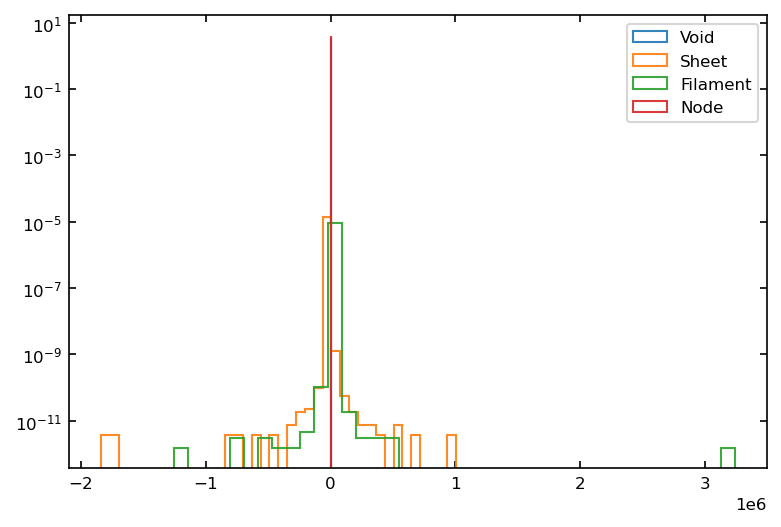

In [75]:
plt.hist(calculation2(np.array(eign_class['void'])), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
plt.hist(calculation2(np.array(eign_class['sheet'])), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
plt.hist(calculation2(np.array(eign_class['filament'])), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(calculation2(np.array(eign_class['node'])), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    

plt.legend()
plt.show()

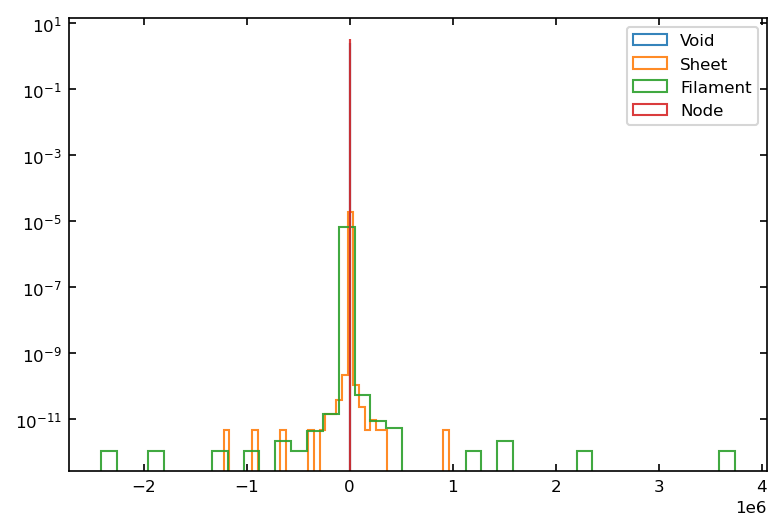

In [76]:
plt.hist(calculation3(np.array(eign_class['void'])), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
plt.hist(calculation3(np.array(eign_class['sheet'])), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
plt.hist(calculation3(np.array(eign_class['filament'])), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(calculation3(np.array(eign_class['node'])), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    

plt.legend()
plt.show()

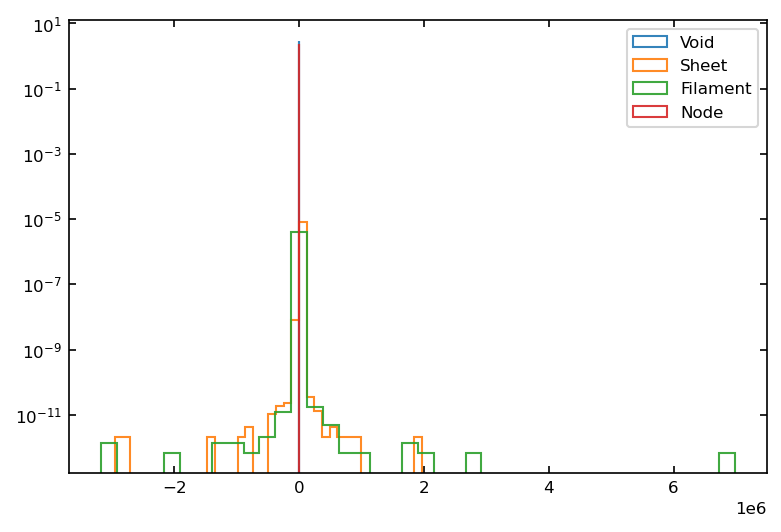

In [77]:
plt.hist(calculation4(np.array(eign_class['void'])), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
plt.hist(calculation4(np.array(eign_class['sheet'])), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
plt.hist(calculation4(np.array(eign_class['filament'])), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(calculation4(np.array(eign_class['node'])), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    

plt.legend()
plt.show()

In [78]:
def calculation(data):
    return 3 * np.sqrt((data[:, 0] - data[:, 1])**2 + (data[:, 1] - data[:, 2])**2 + (data[:, 0] - data[:, 2])**2) / (data[:, 0] + data[:, 1] + data[:, 2])

In [79]:
calculation(data_v)

array([2.10860217, 3.32429849, 3.80663211, ..., 0.50938572, 2.1389761 ,
       1.79560884])

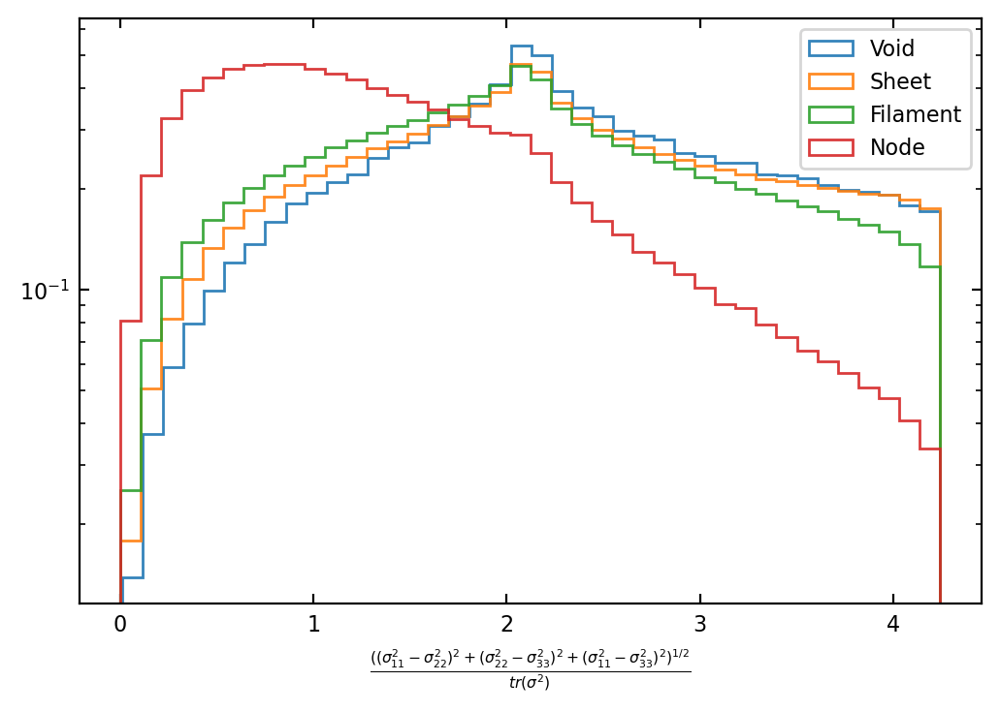

In [80]:
plt.figure(dpi = 200)
plt.hist(calculation(data_v), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
plt.hist(calculation(data_s), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
plt.hist(calculation(data_f), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(calculation(data_n), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    

plt.xlabel(r'$\frac{((\sigma^2_{11} - \sigma^2_{22})^2 + (\sigma^2_{22} - \sigma^2_{33})^2 + (\sigma^2_{11} - \sigma^2_{33})^2)^{1/2}}{tr(\sigma^2)}$')

plt.legend()
plt.show()

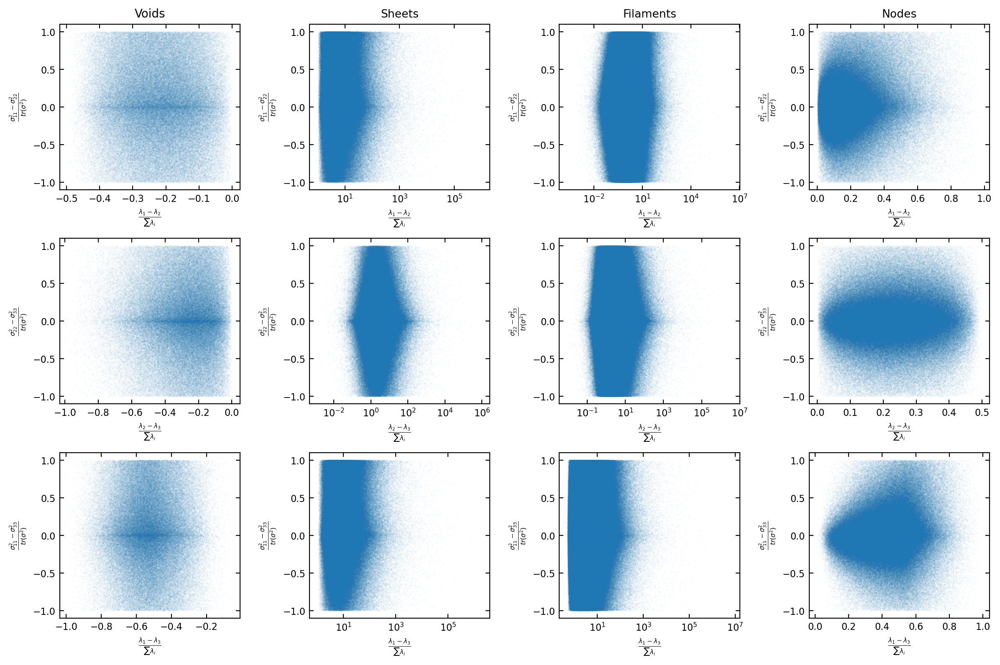

In [81]:
import matplotlib.gridspec as gridspec

# Create a figure and gridspec layout
fig = plt.figure(figsize=(12, 8), dpi=200)
gs = gridspec.GridSpec(3, 4)

# Plot for class 'void'
ax_void = plt.subplot(gs[0, 0])
ax_void.scatter(calculation2(np.array(eign_class['void'])), calculation2(data_v), label='Void', s=0.01, alpha=0.1)
ax_void.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{2}}{\sum\lambda_i}$')
ax_void.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
ax_void.set_title('Voids', fontsize = 10)

# Plot for class 'sheet'
ax_sheet = plt.subplot(gs[0, 1])
ax_sheet.scatter(calculation2(np.array(eign_class['sheet'])), calculation2(data_s), label='Sheets', s=0.01, alpha=0.1)
ax_sheet.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{2}}{\sum\lambda_i}$')
ax_sheet.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
ax_sheet.set_title('Sheets')
ax_sheet.set_xscale('log')

# Plot for class 'filament'
ax_filament = plt.subplot(gs[0, 2])
ax_filament.scatter(calculation2(np.array(eign_class['filament'])), calculation2(data_f), label='Filaments', s=0.01, alpha=0.1)
ax_filament.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{2}}{\sum\lambda_i}$')
ax_filament.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
ax_filament.set_title('Filaments')
ax_filament.set_xscale('log')

# Plot for class 'node'
ax_node = plt.subplot(gs[0, 3])
ax_node.scatter(calculation2(np.array(eign_class['node'])), calculation2(data_n), label='Node', s=0.01, alpha=0.1)
ax_node.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{2}}{\sum\lambda_i}$')
ax_node.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{22}}{tr(\sigma^2)}$')
ax_node.set_title('Nodes')

#---------------------------------------#
# Plot for class 'void'
ax_void = plt.subplot(gs[1, 0])
ax_void.scatter(calculation3(np.array(eign_class['void'])), calculation3(data_v), label='Void', s=0.01, alpha=0.1)
ax_void.set_xlabel(r'$\frac{\lambda_{2} - \lambda_{3}}{\sum\lambda_i}$')
ax_void.set_ylabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')

# Plot for class 'sheet'
ax_sheet = plt.subplot(gs[1, 1])
ax_sheet.scatter(calculation3(np.array(eign_class['sheet'])), calculation3(data_s), label='Sheets', s=0.01, alpha=0.1)
ax_sheet.set_xlabel(r'$\frac{\lambda_{2} - \lambda_{3}}{\sum\lambda_i}$')
ax_sheet.set_ylabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')
ax_sheet.set_xscale('log')

# Plot for class 'filament'
ax_filament = plt.subplot(gs[1, 2])
ax_filament.scatter(calculation3(np.array(eign_class['filament'])), calculation3(data_f), label='Filaments', s=0.01, alpha=0.1)
ax_filament.set_xlabel(r'$\frac{\lambda_{2} - \lambda_{3}}{\sum\lambda_i}$')
ax_filament.set_ylabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')
ax_filament.set_xscale('log')

# Plot for class 'node'
ax_node = plt.subplot(gs[1, 3])
ax_node.scatter(calculation3(np.array(eign_class['node'])), calculation3(data_n), label='Node', s=0.01, alpha=0.1)
ax_node.set_xlabel(r'$\frac{\lambda_{2} - \lambda_{3}}{\sum\lambda_i}$')
ax_node.set_ylabel(r'$\frac{\sigma^2_{22} - \sigma^2_{33}}{tr(\sigma^2)}$')

# Plot for class 'void'
ax_void = plt.subplot(gs[2, 0])
ax_void.scatter(calculation4(np.array(eign_class['void'])), calculation4(data_v), label='Void', s=0.01, alpha=0.1)
ax_void.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{3}}{\sum\lambda_i}$')
ax_void.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')

# Plot for class 'sheet'
ax_sheet = plt.subplot(gs[2, 1])
ax_sheet.scatter(calculation4(np.array(eign_class['sheet'])), calculation4(data_s), label='Sheets', s=0.01, alpha=0.1)
ax_sheet.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{3}}{\sum\lambda_i}$')
ax_sheet.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')
ax_sheet.set_xscale('log')

# Plot for class 'filament'
ax_filament = plt.subplot(gs[2, 2])
ax_filament.scatter(calculation4(np.array(eign_class['filament'])), calculation4(data_f), label='Filaments', s=0.01, alpha=0.1)
ax_filament.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{3}}{\sum\lambda_i}$')
ax_filament.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')
ax_filament.set_xscale('log')

# Plot for class 'node'
ax_node = plt.subplot(gs[2, 3])
ax_node.scatter(calculation4(np.array(eign_class['node'])), calculation4(data_n), label='Node', s=0.01, alpha=0.1)
ax_node.set_xlabel(r'$\frac{\lambda_{1} - \lambda_{3}}{\sum\lambda_i}$')
ax_node.set_ylabel(r'$\frac{\sigma^2_{11} - \sigma^2_{33}}{tr(\sigma^2)}$')

plt.tight_layout()
plt.show()

In [85]:
eign_class['filament'][0]

array([ 0.88807372,  0.1007635 , -0.8908476 ])

In [86]:
np.max(np.abs(calculation2(np.array(eign_class['filament']))))

10224506.15252597

In [87]:
np.corrcoef(calculation2(np.array(eign_class['sheet'])), calculation2(data_s))[0,1]

-0.0012640900866562295

In [88]:
fig, axs = plt.subplots(3, 1, figsize=(7, 6), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

for i in range(3):
    try:
        axs[i].hist(calculation(data_v), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
        axs[i].hist(calculation(data_s), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
        axs[i].hist(calculation(data_f), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
        axs[i].hist(calculation(data_n), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
#         axs[i].text(32, 1e-2, r'{}'.format([r'$\frac{\sigma_{11}}{\sigma_{22}}$', r'$\frac{\sigma_{22}}{\sigma_{33}}$', r'$\frac{\sigma_{11}}{\sigma_{33}}$'][i]), fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))

    
#     except:
#         axs[i].hist(np.log(np.abs(data_v[:, 0] / data_v[:, i]) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
#         axs[i].hist(np.log(np.abs(data_s[:, 0] / (data_s[:, i] + 1e-20)) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
#         axs[i].hist(np.log(np.abs(data_f[:, 0] / (data_f[:, i] + 1e-20)) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
#         axs[i].hist(np.log(np.abs(data_n[:, 0] / data_n[:, i]) + 1e-30), bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
#         axs[i].text(32, 1e-2, r'{}'.format([r'$\frac{\sigma_{11}}{\sigma_{22}}$', r'$\frac{\sigma_{22}}{\sigma_{33}}$', r'$\frac{\sigma_{11}}{\sigma_{33}}$'][i]), fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))
        
# axs[0].set_title('Velocity dispersion components in all environments')
# axs[1].set_ylabel('Frequency (log scale)')
axs[0].legend(fontsize=7)

# axs[-1].set_xlim(-40, 50)

# axs[-1].set_xlabel(r'log$\left(|\frac{\sigma_{ii}}{\sigma_{jj}}|\right)$', fontsize = 10)

plt.show()


SyntaxError: expected 'except' or 'finally' block (4124142051.py, line 22)

In [ ]:
np.array(eign_class['void']).shape

In [ ]:
np.array(eign_class['sheet'])[0]

In [ ]:
np.min(eign_class['filament'])

In [ ]:
0.79920471 / 0.17555129

In [ ]:
x = ((np.array(eign_class['filament'])[:, 0] / np.array(eign_class['filament'])[:, 1]) > 0)

In [ ]:
x

In [ ]:
x.astype(int)

In [ ]:
np.sum(x)

In [ ]:
len(np.array(eign_class['filament'])[:, 0])

In [ ]:
0.14456867 / (-0.71799612)

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(7, 6), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

axs[0].hist(1e6*np.array(eign_class['void'])[:, 0] / np.array(eign_class['void'])[:, 1], bins=40, log=True, density=True, alpha=0.9, label=r'Void $\times~10^{6}$', histtype='step')
axs[0].hist(np.array(eign_class['sheet'])[:, 0] / np.array(eign_class['sheet'])[:, 1], bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
axs[0].hist(np.array(eign_class['filament'])[:, 0] / np.array(eign_class['filament'])[:, 1], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
axs[0].hist(1e5*np.array(eign_class['node'])[:, 0] / np.array(eign_class['node'])[:, 1], bins=40, log=True, density=True, alpha=0.9, label=r'Node $\times~10^{5}$', histtype='step')    
axs[0].text(-2e7, 1e-7, r'$\frac{x_1}{x_2}$', fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))
axs[0].legend(fontsize=7)

axs[1].hist(1e6*np.array(eign_class['void'])[:, 1] / np.array(eign_class['void'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label=r'Void $\times~10^{6}$', histtype='step')
axs[1].hist(1e7*np.array(eign_class['sheet'])[:, 1] / np.array(eign_class['sheet'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label=r'Sheet $\times~10^{6}$', histtype='step')
axs[1].hist(np.array(eign_class['filament'])[:, 1] / np.array(eign_class['filament'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
axs[1].hist(np.array(eign_class['node'])[:, 1] / np.array(eign_class['node'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
axs[1].text(-2e7, 1e-7, r'$\frac{x_2}{x_3}$', fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))
axs[1].legend(fontsize=7)

axs[2].hist(1e7*np.array(eign_class['void'])[:, 0] / np.array(eign_class['void'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label=r'Void $\times~10^{7}$', histtype='step')
axs[2].hist(1e5*np.array(eign_class['sheet'])[:, 0] / np.array(eign_class['sheet'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label=r'Sheet $\times~10^{5}$', histtype='step')
axs[2].hist(np.array(eign_class['filament'])[:, 0] / np.array(eign_class['filament'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
axs[2].hist(np.array(eign_class['node'])[:, 0] / np.array(eign_class['node'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
axs[2].text(-2e7, 1e-7, r'$\frac{x_1}{x_3}$', fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))
axs[2].legend(fontsize=7)

axs[0].set_title('Eigenvalues in all environments')
axs[1].set_ylabel('Frequency (log scale)')

axs[-1].set_xlabel(r'$x_i / x_j$')

plt.show()


In [ ]:
plt.figure(figsize = (6, 3), dpi = 300)

plt.hist(1e6*np.array(eign_class['void'])[:, 0] / np.array(eign_class['void'])[:, 1], bins=40, log=True, density=True, alpha=0.9, label=r'Void $\times~10^{6}$', histtype='step')
plt.hist(np.array(eign_class['sheet'])[:, 0] / np.array(eign_class['sheet'])[:, 1], bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype='step')
plt.hist(np.array(eign_class['filament'])[:, 0] / np.array(eign_class['filament'])[:, 1], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(1e4*np.array(eign_class['node'])[:, 0] / np.array(eign_class['node'])[:, 1], bins=40, log=True, density=True, alpha=0.9, label=r'Node $\times~10^{4}$', histtype='step')    
#         axs[i].text(0.6e6, 1e-4, f"{['First component', 'Second component', 'Third component'][i]}", fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

plt.title(r'$x_1 / x_2$')
plt.xlabel(r'$x_i / x_j$')
plt.legend()
plt.show()

In [ ]:
plt.figure(figsize = (6, 3), dpi = 300)

plt.hist(1e6*np.array(eign_class['void'])[:, 1] / np.array(eign_class['void'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label=r'Void $\times~10^{6}$', histtype='step')
plt.hist(1e6*np.array(eign_class['sheet'])[:, 1] / np.array(eign_class['sheet'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label=r'Sheet $\times~10^{6}$', histtype='step')
plt.hist(np.array(eign_class['filament'])[:, 1] / np.array(eign_class['filament'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(np.array(eign_class['node'])[:, 1] / np.array(eign_class['node'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
#         axs[i].text(0.6e6, 1e-4, f"{['First component', 'Second component', 'Third component'][i]}", fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

plt.title(r'$x_2 / x_3$')
plt.xlabel(r'$x_i / x_j$')
plt.legend()
plt.show()

In [ ]:
plt.figure(figsize = (6, 3), dpi = 300)

plt.hist(1e7*np.array(eign_class['void'])[:, 0] / np.array(eign_class['void'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label=r'Void $\times~10^{7}$', histtype='step')
plt.hist(1e5*np.array(eign_class['sheet'])[:, 0] / np.array(eign_class['sheet'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label=r'Sheet $\times~10^{5}$', histtype='step')
plt.hist(np.array(eign_class['filament'])[:, 0] / np.array(eign_class['filament'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype='step')
plt.hist(np.array(eign_class['node'])[:, 0] / np.array(eign_class['node'])[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype='step')    
#         axs[i].text(0.6e6, 1e-4, f"{['First component', 'Second component', 'Third component'][i]}", fontsize = 7, bbox=dict(facecolor='white', lw = 0.5))

# plt.xlim(-1e7, 1e7)
plt.title(r'$x_1 / x_3$')
plt.xlabel(r'$x_i / x_j$')
plt.legend()
plt.show()

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(7, 6), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

for i in range(3):
    try:
        axs[i].hist(eign_054[:, i] / eign_054[:, i+1], bins=40, log=True, density=True, alpha=0.9, histtype='step')
#         axs[i].text(32, 1e-2, r'{}'.format([r'$\frac{\sigma_{11}}{\sigma_{22}}$', r'$\frac{\sigma_{22}}{\sigma_{33}}$', r'$\frac{\sigma_{11}}{\sigma_{33}}$'][i]), fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))

    
    except:
        axs[i].hist(eign_054[:, 0] / eign_054[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Void', histtype='step')
        axs[i].text(32, 1e-2, r'{}'.format([r'$\frac{\sigma_{11}}{\sigma_{22}}$', r'$\frac{\sigma_{22}}{\sigma_{33}}$', r'$\frac{\sigma_{11}}{\sigma_{33}}$'][i]), fontsize = 12, bbox=dict(facecolor='white', lw = 0.5))
        
axs[0].set_title('Velocity dispersion components in all environments')
axs[1].set_ylabel('Frequency (log scale)')

axs[-1].set_xlabel(r'$log\left(1 + \frac{\sigma_{ii}}{\sigma_{jj}}\right)$')

plt.show()

In [ ]:
x = np.where(class_054 == 0)

In [ ]:
x

In [ ]:
plt.figure(figsize = (5, 4), dpi = 300)
plt.scatter(rho054, v_disp[:, :, :, 0, 0], s = 0.05, alpha = 0.01)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'density contrast $\delta$')
plt.ylabel(r'$\sigma^2_{ii}~[Km^{-2}~s^{-1}]$')
plt.show()

In [ ]:
plt.figure(figsize = (5, 4), dpi = 300)
plt.scatter(rho054, v_disp[:, :, :, 1, 1], s = 0.05, alpha = 0.01)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'density contrast $\delta$')
plt.ylabel(r'$\sigma^2_{ii}~[Km^{-2}~s^{-1}]$')
plt.show()

In [ ]:
plt.figure(figsize = (5, 4), dpi = 300)
plt.scatter(rho054, v_disp[:, :, :, 2, 2], s = 0.05, alpha = 0.01)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'density contrast $\delta$')
plt.ylabel(r'$\sigma^2_{ii}~[Km^{-2}~s^{-1}]$')
plt.show()

In [ ]:
mean_comp_1 = [np.mean(data_v[:, 0]), np.mean(data_s[:, 0]), np.mean(data_f[:, 0]), np.mean(data_n[:, 0])]
mean_comp_2 = [np.mean(data_v[:, 1]), np.mean(data_s[:, 1]), np.mean(data_f[:, 1]), np.mean(data_n[:, 1])]
mean_comp_3 = [np.mean(data_v[:, 2]), np.mean(data_s[:, 2]), np.mean(data_f[:, 2]), np.mean(data_n[:, 2])]

In [ ]:
plt.figure(figsize = (6, 4), dpi = 300)

plt.hist(data_v[:, 0], bins=40, log=True, density=True, alpha=0.9, label='Void', histtype = 'step')
plt.hist(data_s[:, 0], bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype = 'step')
plt.hist(data_f[:, 0], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype = 'step')
plt.hist(data_n[:, 0], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype = 'step')

# Add labels and legend
plt.title('First component in all environments')
plt.xlabel('$\sigma^2_{ii}~[km^2~s^{-2}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()

In [ ]:
plt.figure(figsize = (6, 4), dpi = 300)

plt.hist(data_v[:, 1], bins=40, log=True, density=True, alpha=0.9, label='Void', histtype = 'step')
plt.hist(data_s[:, 1], bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype = 'step')
plt.hist(data_f[:, 1], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype = 'step')
plt.hist(data_n[:, 1], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype = 'step')

# Add labels and legend
plt.title('Second component in all environments')
plt.xlabel('$\sigma^2_{ii}~[km^2~s^{-2}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()

In [ ]:
plt.figure(figsize = (6, 4), dpi = 300)

plt.hist(data_v[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Void', histtype = 'step')
plt.hist(data_s[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Sheet', histtype = 'step')
plt.hist(data_f[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Filament', histtype = 'step')
plt.hist(data_n[:, 2], bins=40, log=True, density=True, alpha=0.9, label='Node', histtype = 'step')

# Add labels and legend
plt.title('Third component in all environments')
plt.xlabel('$\sigma^2_{ii}~[km^2~s^{-2}]$')
plt.ylabel('Frequency (log scale)')
plt.legend(fontsize = 9)

plt.show()

In [118]:
environments = ['void', 'sheet', 'filament', 'node']

trace_data = []

for i, env in enumerate(environments):
    matrices = np.array(velocity_dispersion_class[env])
    
    # Calculate the trace of the matrix along the specified axes
    trace_values = np.trace(matrices, axis1=-2, axis2=-1)

    # Assign the trace value to the corresponding index in the data array
    trace_data.append(np.array(trace_values))

In [ ]:
fig, ax = plt.subplots(2, 2, figsize = (8, 5), dpi = 250)

axes = ax.flatten()

for i, ax in enumerate(axes):
    ax.hist(trace_data[i], bins=25, density = True, log = True, histtype='step', edgecolor='black', lw = 10, facecolor='#7EA4BF', alpha = 0.7, linewidth=1.2, fill = True)
    ax.axvline(np.mean(trace_data[i]), label = f'Mean = {np.mean(trace_data[i]):1.2e}', ls = '--', color = 'teal', lw = 1)
    ax.axvline(np.median(trace_data[i]), label = f'Median = {np.median(trace_data[i]):1.2e}', ls = '--', color = 'crimson', lw = 1)
    ax.set_xlabel('tr($\sigma^2_{ij})~ [km^2~sec^{-2}]$', fontsize = 8)
    ax.set_ylabel('Frequency', fontsize = 8)
    ax.set_title(f'{environments[i]}', fontsize = 10)
    ax.tick_params(labelsize = 8, axis='both', which='both', labelleft=True, labelright=False, left=True, right=True, top = True, bottom = True, direction = 'in')
    ax.legend(fontsize = 7, handlelength = 1.5)
    ax.xaxis.get_offset_text().set_fontsize(8)

fig.suptitle('Velocity dispersion for different environments', y=1.0, fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
def normalize_velocity(velocity_data, min_range = 0, max_range = 1):
    """
    Normalize velocity data using Min-Max Scaling.

    Parameters:
    - velocity_data: NumPy array or list containing velocity data.
    - min_range: Minimum value after normalization.
    - max_range: Maximum value after normalization.

    Returns:
    - normalized_velocity_data: NumPy array containing normalized velocity data.
    """

    # Calculate the min and max values of the velocity_data
    min_value = np.min(velocity_data)
    max_value = np.max(velocity_data)

    # Perform Min-Max Scaling
    normalized_velocity_data = min_range + (max_range - min_range) * ((velocity_data - min_value) / (max_value - min_value))

    return normalized_velocity_data

In [ ]:
normalized_velocity_v = normalize_velocity(trace_data[0])
normalized_velocity_s = normalize_velocity(trace_data[1])
normalized_velocity_f = normalize_velocity(trace_data[2])
normalized_velocity_n = normalize_velocity(trace_data[3])

norm_vels = [normalized_velocity_v, normalized_velocity_s, normalized_velocity_f, normalized_velocity_n]

In [92]:
np.mean(data_v_diag[:, 2])

-0.04561965751901748

In [90]:
np.mean(data_v_diag, axis = 0)

array([-0.02811994,  0.01224675, -0.04561966])

In [123]:
trace_data

[array([  0.72522532,   7.46091709,   7.17736773, ...,  42.75303934,
        187.87666868,   1.73011338]),
 array([253.24525003,   5.50268169,  19.63312195, ...,   7.04872928,
         99.56273975, 169.88814565]),
 array([  19.14423456, 1056.2426157 ,  399.39865686, ...,  197.59132809,
           2.12543133,   79.39070718]),
 array([ 615.56968276,  325.72459102,  500.15622241, ...,  644.20934597,
        3469.97104252, 5027.66028599])]

In [119]:
data_std = []
data_skw = []
mean_vel_disp = []
md_vel_disp = []
# data_envs = [data_v_diag, data_s_diag, data_f_diag, data_n_diag]

for i in range(4):
    
    mean_vd = np.mean(trace_data[i])
#     median_vd = np.median(data_envs[i], axis = 0)
#     std_ = np.std(data_envs[i], axis = 1)
#     skw_ = stats.skew(data_envs[i], axis = 0)

    mean_vel_disp.append(mean_vd)
#     md_vel_disp.append(median_vd)
#     data_std.append(std_)
#     data_skw.append(skw_)

In [125]:
mean_vel_disp

[97.187347453644, 1316.1927719345786, 17698.45242441999, 55893.442173181895]

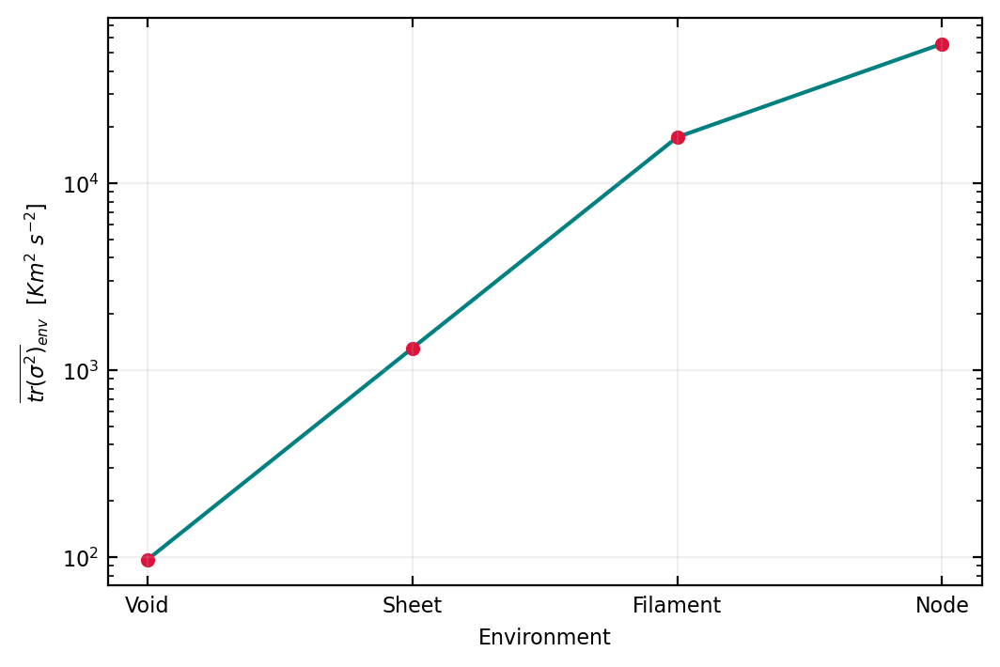

In [122]:
plt.figure(dpi = 200)
plt.scatter(['Void', 'Sheet', 'Filament', 'Node'], mean_vel_disp, color = 'crimson', zorder = 1, s = 20)
plt.plot(['Void', 'Sheet', 'Filament', 'Node'], mean_vel_disp, color = 'teal', zorder = 0)
plt.grid(True, alpha = 0.2)
plt.yscale('log')
plt.xlabel('Environment')
plt.ylabel(r'$\overline{tr(\sigma^2)}_{env}~~[Km^2~s^{-2}]$')
plt.show()

In [94]:
data_std = []
data_skw = []
mean_vel_disp = []
md_vel_disp = []
data_envs = [eign_class['void'], eign_class['sheet'], eign_class['filament'], eign_class['node']]

for i in range(4):
    
    mean_vd = np.mean(data_envs[i], axis = 0)
    median_vd = np.median(data_envs[i], axis = 0)
    std_ = np.std(data_envs[i], axis = 1)
    skw_ = stats.skew(data_envs[i], axis = 0)

    mean_vel_disp.append(mean_vd)
    md_vel_disp.append(median_vd)
    data_std.append(std_)
    data_skw.append(skw_)

In [103]:
data_std[1]

array([16.90794947,  1.06771603,  2.80313521, ...,  0.73345084,
       22.96687532, 32.68400464])

In [101]:
np.std(data_s_diag[0])

16.90794947130936

ValueError: x and y must have same first dimension, but have shapes (3,) and (202004,)

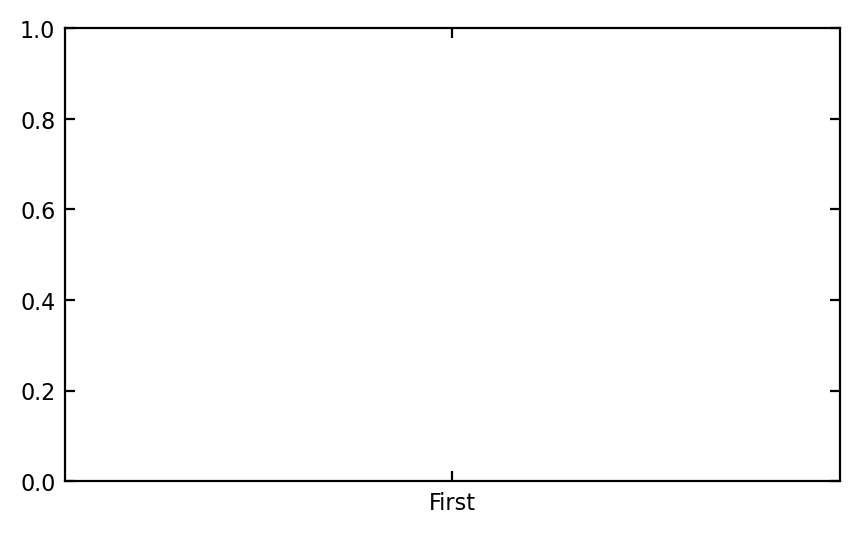

In [96]:
labels = ['Void', 'Sheet', 'Filament', 'Node']

plt.figure(figsize = (5, 3), dpi = 200)
plt.plot(['First', 'Second', 'Third'], data_std[0], 'o-', label = 'Void', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_std[1], 'o-', label = 'Sheet', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_std[2], 'o-', label = 'Filament', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_std[3], 'o-', label = 'Cluster', ms = 4)
    
plt.title('Standard deviation in different environments')
plt.xlabel('Environment')
# plt.ylabel('$tr(\sigma^2_{ij})~[km^2~sec^{-2}]$')
plt.tick_params(labelsize = 8)
plt.legend(bbox_to_anchor = (1.35, 0.5), fontsize = 7, markerscale = 0.5, handlelength = 1.5)
# plt.ylim(-5, 1e8)
plt.yscale('log')
plt.show()

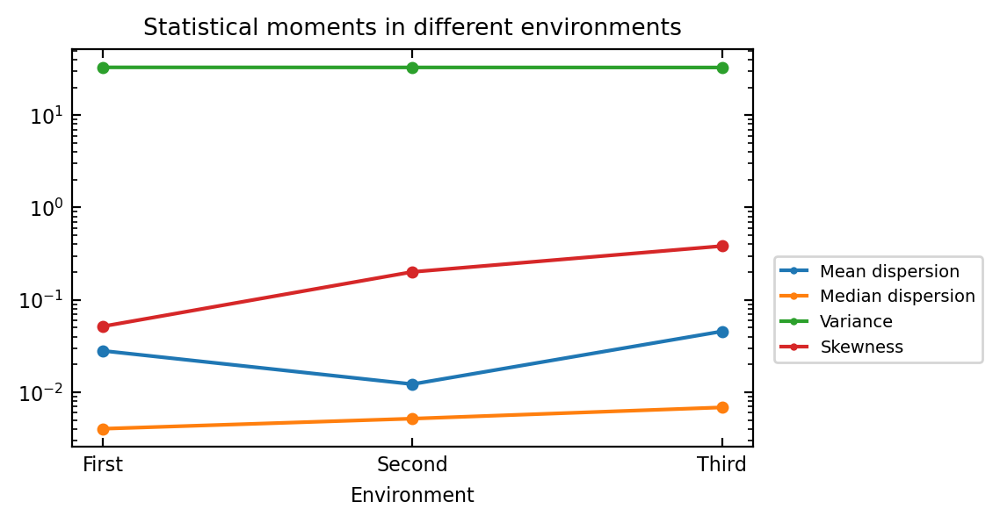

In [92]:
labels = ['Voids', 'Sheet', 'Filament', 'Void']

plt.figure(figsize = (5, 3), dpi = 200)
plt.plot(['First', 'Second', 'Third'], np.abs(mean_vel_disp[0]), 'o-', label = 'Mean dispersion', ms = 4)
plt.plot(['First', 'Second', 'Third'], np.abs(md_vel_disp[0]), 'o-', label = 'Median dispersion', ms = 4)
plt.plot(['First', 'Second', 'Third'], np.abs(data_std[0]), 'o-', label = 'Variance', ms = 4)
plt.plot(['First', 'Second', 'Third'], np.abs(data_skw[0]), 'o-', label = 'Skewness', ms = 4)
    
plt.title('Statistical moments in different environments')
plt.xlabel('Environment')
# plt.ylabel('$tr(\sigma^2_{ij})~[km^2~sec^{-2}]$')
plt.tick_params(labelsize = 8)
plt.legend(bbox_to_anchor = (1.35, 0.5), fontsize = 7, markerscale = 0.5, handlelength = 1.5)
# plt.ylim(-5, 1e8)
plt.yscale('log')
plt.show()

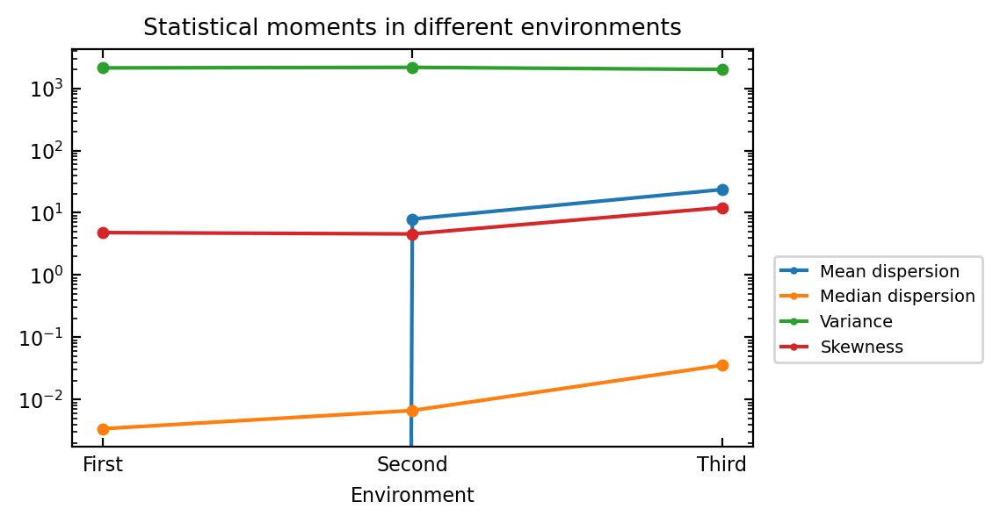

In [116]:
labels = ['Voids', 'Sheet', 'Filament', 'Void']

plt.figure(figsize = (5, 3), dpi = 200)
plt.plot(['First', 'Second', 'Third'], mean_vel_disp[1], 'o-', label = 'Mean dispersion', ms = 4)
plt.plot(['First', 'Second', 'Third'], md_vel_disp[1], 'o-', label = 'Median dispersion', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_std[1], 'o-', label = 'Variance', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_skw[1], 'o-', label = 'Skewness', ms = 4)
    
plt.title('Statistical moments in different environments')
plt.xlabel('Environment')
# plt.ylabel('$tr(\sigma^2_{ij})~[km^2~sec^{-2}]$')
plt.tick_params(labelsize = 8)
plt.legend(bbox_to_anchor = (1.35, 0.5), fontsize = 7, markerscale = 0.5, handlelength = 1.5)
# plt.ylim(-5, 1e8)
plt.yscale('log')
plt.show()

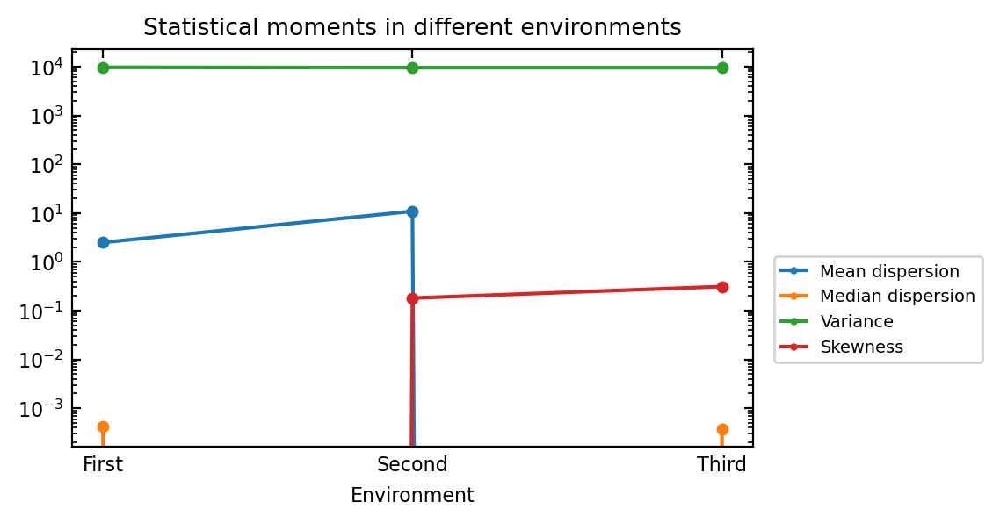

In [115]:
labels = ['Voids', 'Sheet', 'Filament', 'Void']

plt.figure(figsize = (5, 3), dpi = 200)
plt.plot(['First', 'Second', 'Third'], mean_vel_disp[2], 'o-', label = 'Mean dispersion', ms = 4)
plt.plot(['First', 'Second', 'Third'], md_vel_disp[2], 'o-', label = 'Median dispersion', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_std[2], 'o-', label = 'Variance', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_skw[2], 'o-', label = 'Skewness', ms = 4)
    
plt.title('Statistical moments in different environments')
plt.xlabel('Environment')
# plt.ylabel('$tr(\sigma^2_{ij})~[km^2~sec^{-2}]$')
plt.tick_params(labelsize = 8)
plt.legend(bbox_to_anchor = (1.35, 0.5), fontsize = 7, markerscale = 0.5, handlelength = 1.5)
# plt.ylim(-5, 1e8)
plt.yscale('log')
plt.show()

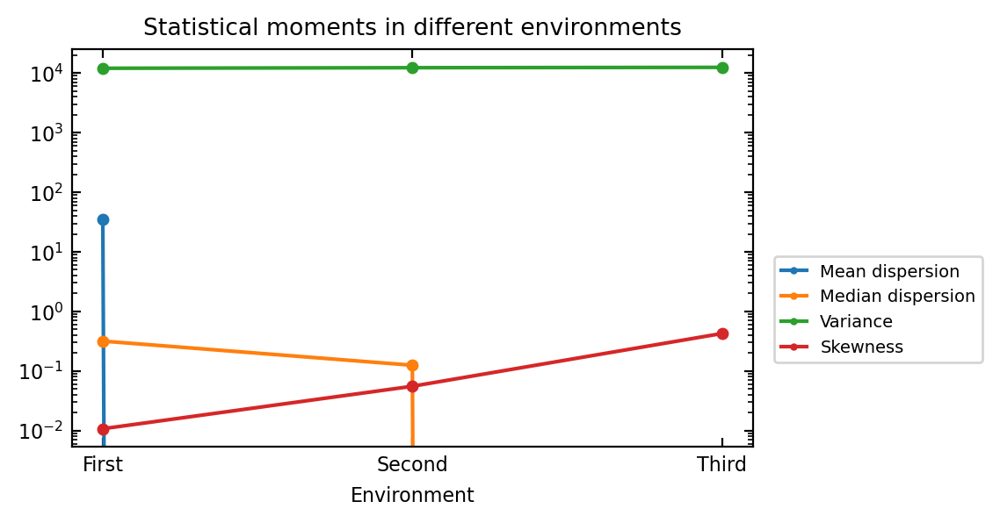

In [114]:
labels = ['Voids', 'Sheet', 'Filament', 'Void']

plt.figure(figsize = (5, 3), dpi = 200)
plt.plot(['First', 'Second', 'Third'], mean_vel_disp[3], 'o-', label = 'Mean dispersion', ms = 4)
plt.plot(['First', 'Second', 'Third'], md_vel_disp[3], 'o-', label = 'Median dispersion', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_std[3], 'o-', label = 'Variance', ms = 4)
plt.plot(['First', 'Second', 'Third'], data_skw[3], 'o-', label = 'Skewness', ms = 4)
    
plt.title('Statistical moments in different environments')
plt.xlabel('Environment')
# plt.ylabel('$tr(\sigma^2_{ij})~[km^2~sec^{-2}]$')
plt.tick_params(labelsize = 8)
plt.legend(bbox_to_anchor = (1.35, 0.5), fontsize = 7, markerscale = 0.5, handlelength = 1.5)
# plt.ylim(-5, 1e8)
plt.yscale('log')
plt.show()

In [ ]:
data_std = []
data_skw = []
mean_vel_disp = []
md_vel_disp = []

for i in range(len(environments)):
    mean_vd = np.mean(norm_vels[i])
    median_vd = np.median(norm_vels[i])
    std_ = np.std(norm_vels[i])
    skw_ = stats.skew(norm_vels[i])
    
    mean_vel_disp.append(mean_vd)
    md_vel_disp.append(median_vd)
    data_std.append(std_)
    data_skw.append(skw_)

In [ ]:
mean_comp_1

In [ ]:
mean_comp_2

In [ ]:
mean_comp_3

In [ ]:
plt.figure(figsize = (5, 3), dpi = 200)

plt.plot(['Void', 'Sheet', 'Filament', 'Node'], mean_vel_disp, 'o-', label = 'Mean dispersion', ms = 4)
plt.plot(['Void', 'Sheet', 'Filament', 'Node'], md_vel_disp, 'o-', label = 'Median dispersion', ms = 4)
plt.plot(['Void', 'Sheet', 'Filament', 'Node'], data_std, 'o-', label = 'Standard Deviation', ms = 4)
plt.plot(['Void', 'Sheet', 'Filament', 'Node'], data_skw, 'o-', label = 'Skewness', ms = 4)
plt.title('Statistical moments in different environments')
plt.xlabel('Environment')
plt.ylabel('$tr(\sigma^2_{ij})~[km^2~sec^{-2}]$')
plt.tick_params(labelsize = 8)
plt.legend(bbox_to_anchor = (1.35, 0.5), fontsize = 7, markerscale = 0.5, handlelength = 1.5)
plt.yscale('log')
plt.show()

In [ ]:
tr_res = []

for i in range(len(environments)):
    res = trace_data[i] - mean_vel_disp[i]
    tr_res.append(np.array(res))

In [ ]:
fig, ax = plt.subplots(2, 2, figsize = (8, 5), dpi = 200)

axes = ax.flatten()

for i, ax in enumerate(axes):
    ax.hist(tr_res[i], bins=25, density = True, log = True, histtype='step', edgecolor='black', lw = 10, facecolor='#7EA4BF', alpha = 0.7, linewidth=1.2, fill = True)
    ax.axvline(np.mean(trace_data[i]), label = f'Mean = {np.mean(trace_data[i]):1.2e}', ls = '--', color = 'teal', lw = 1)
    ax.axvline(np.median(trace_data[i]), label = f'Median = {np.median(trace_data[i]):1.2e}', ls = '--', color = 'crimson', lw = 1)
    ax.set_xlabel('tr($\sigma^2_{ij})~ [km^2 / sec^2]$', fontsize = 8)
    ax.set_ylabel('Frequency', fontsize = 8)
    ax.set_title(f'{environments[i]}', fontsize = 10)
    ax.tick_params(labelsize = 8, axis='both', which='both', labelleft=True, labelright=False, left=True, right=True, top = True, bottom = True, direction = 'in')
    ax.legend(fontsize = 7, handlelength = 1.5)
    ax.xaxis.get_offset_text().set_fontsize(8)

fig.suptitle('Residual plot for different environments', y=1.0, fontsize=12)
plt.tight_layout()
plt.show()

### Velocity field visualization

In [ ]:
eps = 1e-15  # so that log doesn't get a value 0
N = 0
slice_index = 256

init = None
final = None

delplot1 = np.log10(rho054 + 1 + eps)
slic1 = np.mean((delplot1[init:final, init:final, N:slice_index + N]), axis=2)
plt.imshow(slic1, cmap='Greys', origin='lower')
plt.show()

In [ ]:
eps = 1e-15  # so that log doesn't get a value 0
N = 0

headlength = 1.7
headaxislength = 1.5
width = 0.0015
headwidth = 3
scale=50000

slice_index = 256
    
init = None
final = None

vels = np.hypot(voxel_vel[:, :, slice_index, 0], voxel_vel[:, :, slice_index, 1])

plt.figure(figsize = (8, 8), dpi = 300)

delplot1 = np.log10(rho054 + 1 + eps)
slic1 = np.mean((delplot1[init:final, init:final, N:slice_index + N]), axis=2)

plt.imshow(slic1, cmap='GnBu', extent = [0, 100, 0, 100], origin='lower')
plt.quiver(voxel_pos[:, :, slice_index, 0], voxel_pos[:, :, slice_index, 1], 
           voxel_vel[:, :, slice_index, 0], voxel_vel[:, :, slice_index, 1], vels,
           headlength = headlength, width = width, headaxislength = headaxislength, scale=scale, headwidth = headwidth,
           pivot = 'mid', angles = 'xy', units = 'height',
           color = 'black', alpha = 1, cmap = plt.cm.plasma)

plt.colorbar(label = 'Velocity [Km/s]', shrink = 0.82)
plt.xlabel('$h^{-1}~Mpc$')
plt.ylabel('$h^{-1}~Mpc$')

plt.show()

In [ ]:
headlength = 1.7
headaxislength = 1.5
width = 0.0015
headwidth = 3
scale=50000

plt.figure(figsize = (8, 8), dpi = 300)
q_plot = plt.quiver(voxel_pos[:, :, 256, 0], voxel_pos[:, :, 256, 1], 
           voxel_vel[:, :, 256, 0], voxel_vel[:, :, 256, 1],
           headlength = headlength, width = width, headaxislength = headaxislength, scale=scale, headwidth = headwidth,
           pivot = 'mid', angles = 'uv', units = 'height',
           color = 'teal', alpha = 1)

#         plt.colorbar(label = 'Velocity [Km/s]')
plt.xlabel('$h^{-1}~Mpc$')
plt.ylabel('$h^{-1}~Mpc$')

plt.show()

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_velocity_field(velocity_field, positions, density_plot = False, headlength = 5, headaxislength = 5, width = 0.002, headwidth = 3, scale=10000):
    
    pos_re = positions.reshape(512, 512, 512, 3)
    
    if velocity_field.shape == (512, 512, 512, 3, 3):
        v_re = velocity_field[:, :, :, np.arange(3), np.arange(3)]
        
    elif velocity_field.shape == (512**3, 3):
        v_re = velocity_field.reshape(512, 512, 512, 3)
    
    else:
        v_re = velocity_field
    
    slice_index = 256
    
    init = None
    final = None
    
    x_pos = pos_re[init:final, init:final, slice_index, 0]
    y_pos = pos_re[init:final, init:final, slice_index, 1]
    
    x_vel = v_re[init:final, init:final, slice_index, 0]
    y_vel = v_re[init:final, init:final, slice_index, 1]
    
    vels = np.hypot(x_vel, y_vel)
    
    steps = None
    mask = slice(None, None, steps), slice(None, None, steps)
    
    if density_plot:
        eps = 1e-15  # so that log doesn't get a value 0
        N = 0
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 10), dpi = 500, gridspec_kw={'width_ratios': [5, 4.6]})
        
        delplot1 = np.log10(rho054 + 1 + eps)
#         slic1 = np.mean((delplot1[init:final, init:final, N:slice_index + N]), axis=2)
        slic1 = delplot1[init:final, init:final, slice_index]
        
        ax1.imshow(slic1, cmap='GnBu', extent = [0, 100, 0, 100], origin='lower')
        q_plot = ax1.quiver(x_pos[mask], y_pos[mask], 
                   x_vel[mask], y_vel[mask], vels[mask],
                   headlength = headlength, width = width, headaxislength = headaxislength, scale=scale, headwidth = headwidth,
                   pivot = 'mid', angles = 'uv', units = 'height',
                   color = 'red', alpha = 1, cmap = plt.cm.plasma)
        
        divider = make_axes_locatable(ax1)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        if velocity_field.shape == (512, 512, 512, 3, 3):
            cbar = plt.colorbar(q_plot, cax=cax, label=r'Velocity Dispersion [$Km^2~s^{-2}$]', orientation='vertical', pad=0.05)
            
        else:
            cbar = plt.colorbar(q_plot, cax=cax, label='Velocity [Km/s]', orientation='vertical', pad=0.05)
        
        cbar.ax.yaxis.tick_right()  # Show ticks on the left side
        cbar.ax.yaxis.set_label_position('right')  # Position the label on the left side
        ax1.set_aspect('equal')

        ax1.set_xlabel('$h^{-1}~Mpc$')
        ax1.set_ylabel('$h^{-1}~Mpc$')
        
        ax2.imshow(slic1, cmap='GnBu', extent = [0, 100, 0, 100], origin='lower')
        ax2.set_xlabel('$h^{-1}~Mpc$')
        ax2.set_ylabel('$h^{-1}~Mpc$')
        
        fig.tight_layout()
        plt.show()
        
    else:
        
        plt.figure(figsize = (8, 8), dpi = 300)
        q_plot = plt.quiver(x_pos[mask], y_pos[mask], 
                   x_vel[mask], y_vel[mask], vels[mask],
                   headlength = headlength, width = width, headaxislength = headaxislength, scale=scale, headwidth = headwidth,
                   pivot = 'mid', angles = 'uv', units = 'height',
                   color = 'red', alpha = 1, cmap = plt.cm.plasma)
        
        if velocity_field.shape == (512, 512, 512, 3, 3):
            plt.colorbar(label = r'Velocity Dispersion [$Km^2~s^{-2}$]')
            
        else:
            plt.colorbar(label = 'Velocity [Km/s]')
            
        plt.xlabel('$h^{-1}~Mpc$')
        plt.ylabel('$h^{-1}~Mpc$')

        plt.show()

In [ ]:
plot_velocity_field(voxel_vel, voxel_pos, density_plot = True, 
                    headlength = 1.5, headaxislength = 2, width = 0.0015, headwidth = 3, scale=50000)

In [ ]:
plot_velocity_field(v_field, pos, density_plot = True, headlength = 5, width = 0.002, headaxislength = 5, scale=10000)

In [ ]:
plot_velocity_field(v_disp, voxel_pos, density_plot = True, 
                    headlength = 1.5, headaxislength = 2, width = 0.0015, headwidth = 3, scale=3000000)